# 1 - Importation
## 1.1 - Librairies

In [1]:
import pandas as pd
import numpy as np

import scipy.stats as st
from scipy import stats
from scipy.cluster.hierarchy import dendrogram
from scipy.cluster.hierarchy import linkage
from scipy.cluster.hierarchy import fcluster
 

import matplotlib.pyplot as plt
import matplotlib.patches as patches
from matplotlib.collections import LineCollection
from matplotlib.lines import Line2D

from adjustText import adjust_text
import prince

from pandas.plotting import parallel_coordinates
import seaborn as sns

from sklearn.cluster import KMeans
from sklearn.cluster import AgglomerativeClustering
from sklearn import decomposition, preprocessing, cluster
from sklearn.impute import SimpleImputer
from sklearn.linear_model import LinearRegression

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

from datetime import datetime
import mplcursors
import mpldatacursor

import plotly.graph_objects as go
import plotly.graph_objs as pgo
from plotly.offline import iplot

import statsmodels.api as sm
import statsmodels.formula.api as smf
from statsmodels.formula.api import ols
import plotly.express as px
import geopandas as gpd

import time
import folium
import json

from kmodes.kprototypes import KPrototypes
from pygal_maps_world.maps import World
from kneed import KneeLocator
from pygal_maps_world.maps import World
from matplotlib.collections import PatchCollection
from descartes import PolygonPatch

import os
os.environ["OMP_NUM_THREADS"] = "1"
os.environ["OPENBLAS_NUM_THREADS"] = "1"
os.environ["MKL_NUM_THREADS"] = "1"
os.environ["VECLIB_MAXIMUM_THREADS"] = "1"
os.environ["NUMEXPR_NUM_THREADS"] = "1"

import threadpoolctl
from pygal.style import Style

import warnings
warnings.filterwarnings("ignore")


## 1.2 - Données nettoyées

In [8]:
data = pd.read_excel("df_finalv2.xlsx")

In [9]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 200 entries, 0 to 199
Data columns (total 32 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   pays                           200 non-null    object 
 1   population                     200 non-null    int64  
 2   %_evolution_2007/2017          200 non-null    float64
 3   cout_viande_pers/an(USD)       200 non-null    float64
 4   PIB_habitant(USD)              200 non-null    float64
 5   dispo_alimentaire(kg/pers/an)  200 non-null    float64
 6   Tx_inflation                   200 non-null    float64
 7   production                     200 non-null    float64
 8   cout_production(USD/t)         200 non-null    float64
 9   import_tonnes                  200 non-null    float64
 10  import_USD                     200 non-null    int64  
 11  prix_import_USD/tonne          200 non-null    float64
 12  importFrance_tonnes            200 non-null    flo

In [10]:
data.head()

,pays,population,%_evolution_2007/2017,cout_viande_pers/an(USD),PIB_habitant(USD),dispo_alimentaire(kg/pers/an),Tx_inflation,production,cout_production(USD/t),import_tonnes,...,excedent_commercial_fr_USD,variation_stock,nourriture,disponibilite_interieure,emission_co2(tonnes),tonne_co2/tonne_poulet,cout_douanes(USD),delai_douanes(heures),stabilite,distance_france(km)
0,Afghanistan,35643418,37.60,0.00,2058.4,1.82,6.96,27850.0,0.0,28937.00,...,0,-6727.0,64000,63514.0,10057.7,363.2,750.0000,96.0000,-2.80,5598
1,Afrique du Sud,56641209,13.29,386.54,13860.3,36.14,6.90,1658159.0,2016.6,480345.55,...,0,5700.0,2110000,2070000.0,571841.1,344.9,667.5000,87.0000,-0.28,8654
2,Albanie,2879355,-3.25,439.46,12771.0,10.58,3.92,12912.0,0.0,17515.47,...,0,0.0,33000,30192.0,10486.4,812.1,77.3000,10.0000,0.38,1605
3,Algerie,41136546,21.05,351.86,11737.4,6.20,5.04,262965.0,2180.7,0.40,...,0,0.0,286000,262965.0,461881.7,1749.7,408.7778,327.3896,-0.92,1338
4,Allemagne,82624374,1.77,243.09,53071.5,10.95,2.76,1009565.0,1459.5,474950.63,...,24809000,181293.0,1492000,913829.0,415700.3,411.8,0.0000,0.0000,0.59,882


# 2 - Statistiques descriptives
## 2.1 - Tableau de résumé statistique

In [11]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
population,200.0,3.765759e+07,1.429160e+08,1486.00,1.779521e+06,7.765180e+06,2.567963e+07,1.410276e+09
%_evolution_2007/2017,200.0,1.585670e+01,1.679203e+01,-17.96,4.495000e+00,1.293000e+01,2.555750e+01,1.201300e+02
cout_viande_pers/an(USD),200.0,2.567267e+02,1.480780e+02,0.00,2.115200e+02,2.907250e+02,3.643625e+02,5.777900e+02
PIB_habitant(USD),200.0,1.875313e+04,2.162408e+04,0.00,3.426975e+03,1.163460e+04,2.718505e+04,1.261440e+05
dispo_alimentaire(kg/pers/an),200.0,1.633130e+01,1.516947e+01,0.00,2.920000e+00,1.307000e+01,2.482000e+01,6.643000e+01
Tx_inflation,200.0,7.922450e+00,3.801776e+01,-3.83,3.575000e-01,2.235000e+00,5.775000e+00,4.808600e+02
production,200.0,5.482239e+05,1.973948e+06,0.00,3.669500e+03,4.814350e+04,1.959655e+05,1.914057e+07
cout_production(USD/t),200.0,5.242210e+02,1.190622e+03,0.00,0.000000e+00,0.000000e+00,0.000000e+00,6.044000e+03
import_tonnes,200.0,5.625234e+04,1.287519e+05,0.00,3.191875e+02,8.032145e+03,4.214073e+04,7.884518e+05
import_USD,200.0,9.119079e+07,2.286320e+08,0.00,6.280000e+05,1.188000e+07,5.919925e+07,1.345726e+09


In [12]:
#df_data = data.set_index("pays")

## 2.2 - Matrice de corrélation

In [13]:
df = data
df = df.dropna()
df = df.replace([np.inf, -np.inf], np.finfo(np.float64).max)
# is_inf = df.applymap(np.isinf)
# df[is_inf] = np.finfo(np.float64).max

x = df.columns.tolist()
x.remove("pays")

z =df[x].corr()

hovercell = list()
for yi, yy in enumerate(x):
    hovercell.append(list())
    for xi, xx in enumerate(x):
        hovercell[-1].append("X: {}<br />Y: {}<br />Corr:{}".format(xx, yy, round(stats.pearsonr(df[xx],df[yy])[0],2)))
        
map = [go.Heatmap(z=z, x=x, y=x,
                 xgap=1, ygap=1,
                 colorbar_thickness=20,
                 colorbar_ticklen=3,
                 hoverinfo='text',
                 text=hovercell)] 
                 
title = "Matrice de corrélation"

layout = go.Layout(title_text=title, title_x=0.5,
                   width= 900, height = 900,
                   xaxis_showgrid = False,
                   yaxis_showgrid = False, 
                   yaxis_autorange = "reversed")

fig = go.Figure(data = map, layout = layout)
iplot(fig, filename = "pandas-heatmap")

## 2.3 - Choix des indicateurs les plus pertinents à conserver
#### <li><i><font color='blue'>population:</font></i> Nombre d'habitants en 2017</li>
#### <li><i><font color='blue'>%_evolution_2007/2017:</font></i> évolution démographique sur 10 ans </li>
#### <li><i><font color='blue'>cout_viande_pers/an(USD):</font></i> montant annuel devant être dépensé par un habitant pour se nourrir de viande de qualité </li>
#### <li><i><font color='blue'>PIB_habitant(USD):</font></i> PIB moyen par habitant</li>
#### <li><i><font color='blue'>Tx_inflation:</font></i> Inflation sur les prix liés à la nourriture, sur une base de 2015</li>
#### <li><i><font color='blue'>production:</font></i> Quantité de viande de poulet produite en tonnes </li>
#### <li><i><font color='blue'>cout_production(USD/t):</font></i> Coût de producion par tonne de viande de poulet, en Dollar US</li>
#### <li><i><font color='blue'>import_tonnes:</font></i> Quantité de viande de poulet importée, en tonnes </li>
#### <li><i><font color='blue'>export_tonnes:</font></i> Quantité de viande de poulet exportée, en tonnes </li>
#### <li><i><font color='blue'>importFrance_tonnes:</font></i> Quantité de viande de poulet importée depuis la France, en tonnes </li>
#### <li><i><font color='blue'>exportFrance_tonnes:</font></i> Quantité de viande de poulet exportée vers la France, en tonnes</li>
#### <li><i><font color='blue'>emision_co2(tonnes):</font></i> Quantité de C02 totale émise, en rapport avec la viande de poulet, en tonnes </li>
#### <li><i><font color='blue'>stabilite:</font></i> Indice de stabilité politique</li>
#### <li><i><font color='blue'>distance_france(km):</font></i> Distance avec la France en km</li>
#### <li><i><font color='blue'>nourriture:</font></i> Viande de poulet utilisée pour la consommation humaine, en tonnes</li>
#### <li><i><font color='blue'>disponibilite_interieure:</font></i> quantité de viande de poulet disponibles en tonnes</li>
#### <li><i><font color='blue'>dispo_alimentaire(kg/pers/an):</font></i> Quantité de viande de poulet consommée, en kg, par habitant et par an</li>
## 2.4 - Modification du df "data" en fonction des indicateurs retenus

In [14]:
df_data = data[["pays","population","%_evolution_2007/2017","cout_viande_pers/an(USD)","PIB_habitant(USD)","Tx_inflation",
             "production","cout_production(USD/t)","import_tonnes","export_tonnes","importFrance_tonnes","exportFrance_tonnes",
             "emission_co2(tonnes)","stabilite","distance_france(km)","nourriture","disponibilite_interieure","dispo_alimentaire(kg/pers/an)"]]
df_data = df_data.set_index("pays")
df_data.head()

,population,%_evolution_2007/2017,cout_viande_pers/an(USD),PIB_habitant(USD),Tx_inflation,production,cout_production(USD/t),import_tonnes,export_tonnes,importFrance_tonnes,exportFrance_tonnes,emission_co2(tonnes),stabilite,distance_france(km),nourriture,disponibilite_interieure,dispo_alimentaire(kg/pers/an)
pays,,,,,,,,,,,,,,,,,
Afghanistan,35643418,37.60,0.00,2058.4,6.96,27850.0,0.0,28937.00,36.99,0.00,0.00,10057.7,-2.80,5598,64000,63514.0,1.82
Afrique du Sud,56641209,13.29,386.54,13860.3,6.90,1658159.0,2016.6,480345.55,58258.84,0.08,0.00,571841.1,-0.28,8654,2110000,2070000.0,36.14
Albanie,2879355,-3.25,439.46,12771.0,3.92,12912.0,0.0,17515.47,0.00,0.00,0.00,10486.4,0.38,1605,33000,30192.0,10.58
Algerie,41136546,21.05,351.86,11737.4,5.04,262965.0,2180.7,0.40,0.00,0.00,0.00,461881.7,-0.92,1338,286000,262965.0,6.20
Allemagne,82624374,1.77,243.09,53071.5,2.76,1009565.0,1459.5,474950.63,300560.64,19245.40,32492.09,415700.3,0.59,882,1492000,913829.0,10.95


In [15]:
df_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 200 entries, Afghanistan to Zimbabwe
Data columns (total 17 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   population                     200 non-null    int64  
 1   %_evolution_2007/2017          200 non-null    float64
 2   cout_viande_pers/an(USD)       200 non-null    float64
 3   PIB_habitant(USD)              200 non-null    float64
 4   Tx_inflation                   200 non-null    float64
 5   production                     200 non-null    float64
 6   cout_production(USD/t)         200 non-null    float64
 7   import_tonnes                  200 non-null    float64
 8   export_tonnes                  200 non-null    float64
 9   importFrance_tonnes            200 non-null    float64
 10  exportFrance_tonnes            200 non-null    float64
 11  emission_co2(tonnes)           200 non-null    float64
 12  stabilite                      182 non-n

### 2.4.1 - Matrice de corrélation affinée avec les indicateurs retenus

In [16]:
df = df_data
df = df.dropna()
df = df.replace([np.inf, -np.inf], np.finfo(np.float64).max)

x = df.columns.tolist()


z =df[x].corr()

hovercell = list()
for yi, yy in enumerate(x):
    hovercell.append(list())
    for xi, xx in enumerate(x):
        hovercell[-1].append("X: {}<br />Y: {}<br />Corr:{}".format(xx, yy, round(stats.pearsonr(df[xx],df[yy])[0],2)))
        
map = [go.Heatmap(z=z, x=x, y=x,
                 xgap=1, ygap=1,
                 colorbar_thickness=20,
                 colorbar_ticklen=3,
                 hoverinfo='text',
                 text=hovercell)] 
                 
title = "Matrice de corrélation"

layout = go.Layout(title_text=title, title_x=0.5,
                   width= 950, height = 800,
                   xaxis_showgrid = False,
                   yaxis_showgrid = False, 
                   yaxis_autorange = "reversed")

fig = go.Figure(data = map, layout = layout)
iplot(fig, filename = "pandas-heatmap")

# 3 - Clustering
## 3.1 - Classification Ascendante hiérarchique - C.A.H
### 3.1.1 - Dendrogramme total

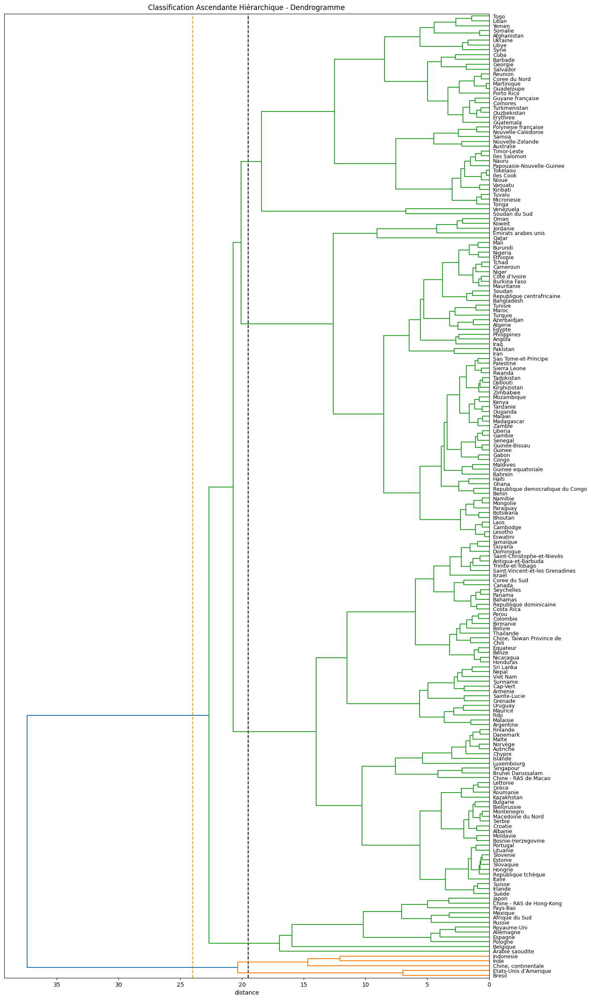

In [17]:
def clust_dendrogram(Z,names):  # Fonction prenant les arguments "Z"(matrice de liaison) et "names"(liste éléments à regrouper)
    plt.figure(figsize=(15,30))    # Taille de la figure
    plt.axvline(x=19.5,color="black", linestyle="dashed")   # Ajout de lignes verticales pointillées délimitant les clusters
    plt.axvline(x=24, color ="orange", linestyle="dashed")
    plt.title("Classification Ascendante Hiérarchique - Dendrogramme")    # Titre du graphique
    plt.xlabel("distance")
    dendrogram(               # Appel de l'affichage du dendrogramme avec les paramètres spécifiques suivants:
        Z,                    # Matrice de liaison générée par le clustering hiérarchique.  
        labels = names,       # Noms des éléments spécifiés comme étiquettes pour les feuilles du dendrogramme.
        truncate_mode="lastp",# Indique que les coupes ds le dendrogramme sont basées sur le nb de feuilles que sur une distance.
        orientation = "left", # Indique l'orientation du dendrogramme sur le côté gauche.
        p=205,                # Nombre de feuilles à afficher avant de tronquer le dendrogramme.
        leaf_font_size = 9    # Taille de police des étiquettes des feuilles.
    )
    plt.show()     # Appel de l'affichage de la figure.
    
    
X = df_data.values    # Les données du df "data" sont extraites et assignées à la variable "X".
X[np.isinf(X)] = np.nan # Remplace les valeurs infinies (vues dans "prix_export_USD/tonne")
X = np.nan_to_num(X)    # Remplace les NaN par des zéros ou d'autres valeurs appropriées.
names = df_data.index # Les noms des éléments à regrouper sont extraits de l'index du df "data" et assignées à la variable "names".

#centrage-réduction
std_scale = preprocessing.StandardScaler().fit(X)    #Les données "X" sont centrées et réduites via la classe "StanardScaler"
# du module "preprocessoring", mettant les variables à la même échelle afin de les comparer correctement ds le clust. hiér.    
X_scaled = std_scale.transform(X)# Les donnéescentrées et réduites sont assignées à la variable "X_scaled".

# Clustering hiérarchique
Z = linkage(X_scaled, "ward", metric= "euclidean")          # Fonction "linkage()" du module "scipy.cluster.hierarchy", utilisée pour effectuer le 
      # clustering hiérarchique sur les données "X_scaled", usant de la méthode de liaison "ward" (consiste à réunir les deux  
      # clusters dont le regroupement fera le moins baisser l'inertie interclasse).Le résultat est une matrice de liaison "Z"
      # qui représente les regroupements successifs des éléments.

# Affichage du dendrogramme
clust_dendrogram(Z,names)

### 3.1.2 - Dendrogramme sur 2 lignes 
#### Après plusieurs essais de dendrogrammes sur des quantités de lignes différentes, on peut s'appercevoir, qu'un groupe de 5 feuilles se détachent des autres (également visibles sur le dendrogramme ci-dessus). Je vais donc, dans un premier temps, approfondir les analyses sur ces 5 feuilles.

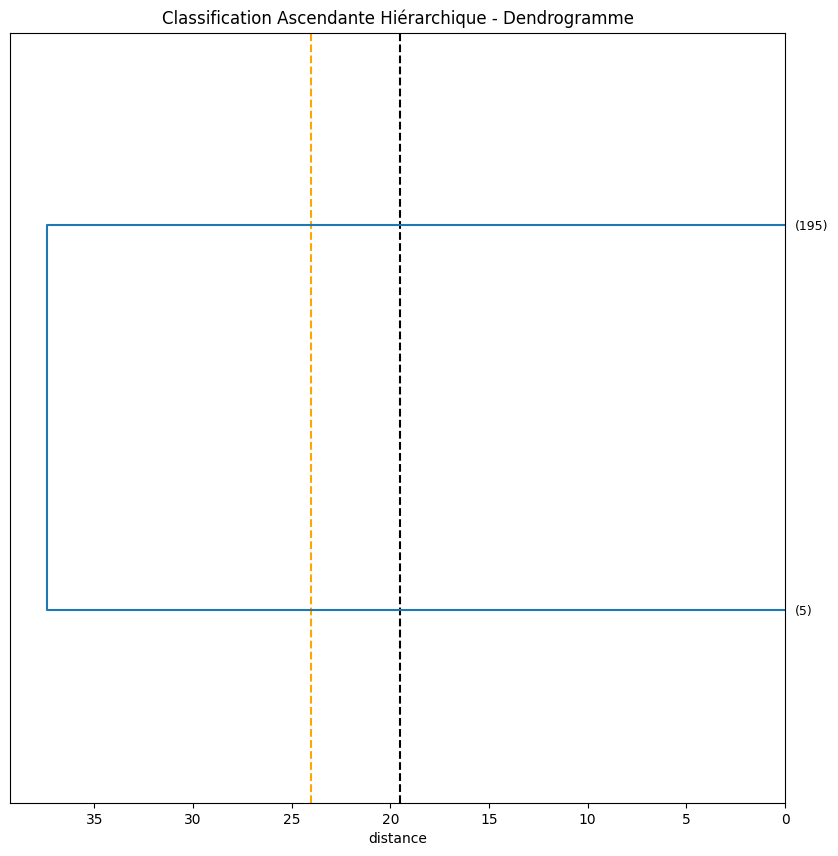

In [18]:
def clust_dendrogram5(Z,names):  
    plt.figure(figsize=(10,10))    
    plt.axvline(x=19.5,color="black", linestyle="dashed")  
    plt.axvline(x=24, color ="orange", linestyle="dashed")
    plt.title("Classification Ascendante Hiérarchique - Dendrogramme")    
    plt.xlabel("distance")
    dendrogram(               
        Z,                    
        labels = names,       
        truncate_mode="lastp",
        orientation = "left", 
        p=2,                
        leaf_font_size = 9    
    )
    plt.show()     
       
clust_dendrogram5(Z,names)

### 3.1.3 - Découpage du dendrogramme en 2 clusters et création d'un df "classes2"

In [19]:
clusters = fcluster(Z,2, criterion = "maxclust")
classes2 = pd.DataFrame({"cluster": clusters,"pays":names})
print(classes2)

     cluster            pays
0          2     Afghanistan
1          2  Afrique du Sud
2          2         Albanie
3          2         Algerie
4          2       Allemagne
..       ...             ...
195        2       Venezuela
196        2        Viet Nam
197        2           Yemen
198        2          Zambie
199        2        Zimbabwe

[200 rows x 2 columns]


In [20]:
classes2.head()

,cluster,pays
0,2,Afghanistan
1,2,Afrique du Sud
2,2,Albanie
3,2,Algerie
4,2,Allemagne


### 3.1.4 - création du df "data_clust2" , par le merge des df "classes2" et "df_data" 

In [21]:
#classes_clust2 = classes.set_index("pays")
data_clust2 = pd.merge(df_data, classes2, on=["pays"], how="outer")
result_clustering2 = data_clust2.drop("pays", axis=1).groupby("cluster").mean()
#result_clustering2 = data_clust2.groupby("cluster").mean()
result_clustering2

,population,%_evolution_2007/2017,cout_viande_pers/an(USD),PIB_habitant(USD),Tx_inflation,production,cout_production(USD/t),import_tonnes,export_tonnes,importFrance_tonnes,exportFrance_tonnes,emission_co2(tonnes),stabilite,distance_france(km),nourriture,disponibilite_interieure,dispo_alimentaire(kg/pers/an)
cluster,,,,,,,,,,,,,,,,,
1,7.134533e+08,10.278000,269.004000,18311.580000,0.90400,1.053219e+07,336.28,102362.014000,1.466737e+06,0.000000,269.292000,6.179609e+06,-0.360000,8327.600000,1.064360e+07,8.925888e+06,22.682000
2,2.032950e+07,15.999744,256.411897,18764.451795,8.10241,2.922249e+05,529.04,55070.038103,3.201131e+04,1496.641487,1537.403949,1.719235e+05,-0.072584,6437.061538,3.140410e+05,2.863419e+05,16.168462


### 3.1.5 - calcul des moyennes des indicateurs dans chaque cluster

In [22]:
df_means2 = result_clustering2.groupby("cluster").mean().round (decimals = 2)
result_clustering2["population"] = result_clustering2["population"].astype(int)
pd.set_option("display.float_format", "{:.2f}".format)
df_means2

,population,%_evolution_2007/2017,cout_viande_pers/an(USD),PIB_habitant(USD),Tx_inflation,production,cout_production(USD/t),import_tonnes,export_tonnes,importFrance_tonnes,exportFrance_tonnes,emission_co2(tonnes),stabilite,distance_france(km),nourriture,disponibilite_interieure,dispo_alimentaire(kg/pers/an)
cluster,,,,,,,,,,,,,,,,,
1,713453336.00,10.28,269.00,18311.58,0.90,10532186.00,336.28,102362.01,1466737.48,0.00,269.29,6179609.34,-0.36,8327.60,10643600.00,8925887.58,22.68
2,20329496.14,16.00,256.41,18764.45,8.10,292224.91,529.04,55070.04,32011.31,1496.64,1537.40,171923.53,-0.07,6437.06,314041.03,286341.86,16.17


### 3.1.6 - visualisation des 2 clusters principaux par un clustermap

In [23]:
df_means2 = df_means2.dropna()
df_means2 = df_means2.replace([np.inf, -np.inf], np.finfo(np.float64).max)
#df_means = np.rot90(df_means)

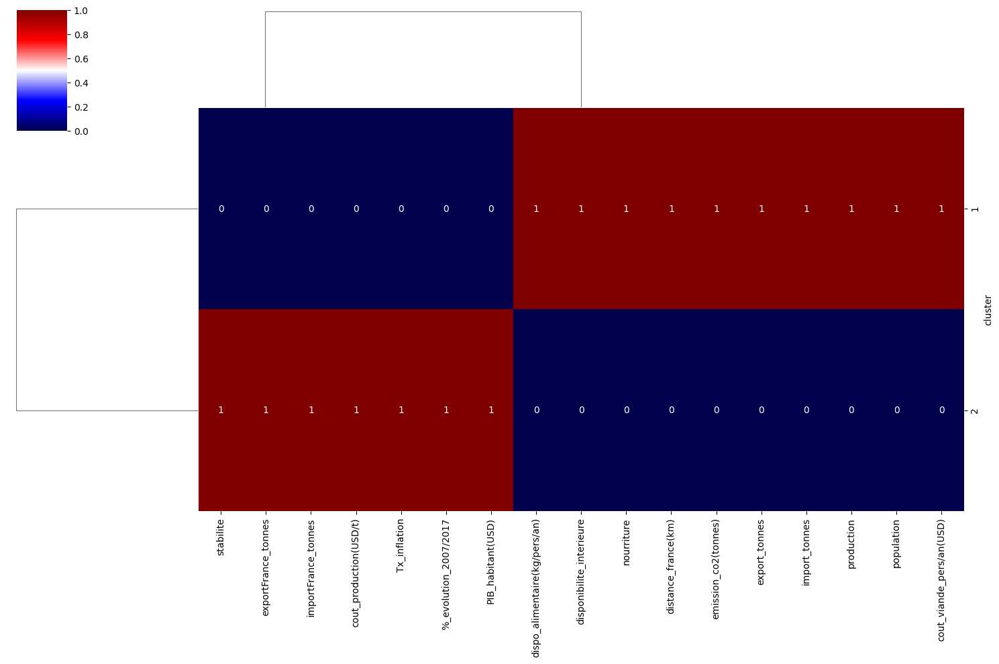

In [24]:
sns.clustermap(df_means2, figsize = (15,10), annot = True, standard_scale =1, cmap="seismic")
plt.show()

### 3.1.7 - Listing des clusters

In [25]:
df_par_cluster2 = {}
for cluster in classes2["cluster"].unique():
    cluster_df2 = classes2[classes2["cluster"] == cluster].copy()
    nom_df = f"cluster{cluster}"
    df_par_cluster2[nom_df] = cluster_df2
    
for nom_df, df_clust in df_par_cluster2.items():
    print(f"cluster {nom_df}:")
    print(df_clust)
    print()

cluster cluster2:
     cluster            pays
0          2     Afghanistan
1          2  Afrique du Sud
2          2         Albanie
3          2         Algerie
4          2       Allemagne
..       ...             ...
195        2       Venezuela
196        2        Viet Nam
197        2           Yemen
198        2          Zambie
199        2        Zimbabwe

[195 rows x 2 columns]

cluster cluster1:
    cluster                   pays
25        1                 Bresil
37        1    Chine, continentale
58        1  Etats-Unis d'Amerique
81        1                   Inde
82        1              Indonesie



In [26]:
df_par_cluster2["cluster1"].head()

,cluster,pays
25,1,Bresil
37,1,"Chine, continentale"
58,1,Etats-Unis d'Amerique
81,1,Inde
82,1,Indonesie


#### Les pays composant le cluster 1 (qui se démarque des autres, dans les dendrogrammes) sont, à première vue, des pays à forte population. Je vais effectuer plusieurs tests en appelant des indicateurs par ordre décroissants, pour voir si ces individus se démarquent uniquement de part leur population, ou non.

In [27]:
df_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 200 entries, Afghanistan to Zimbabwe
Data columns (total 17 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   population                     200 non-null    int64  
 1   %_evolution_2007/2017          200 non-null    float64
 2   cout_viande_pers/an(USD)       200 non-null    float64
 3   PIB_habitant(USD)              200 non-null    float64
 4   Tx_inflation                   200 non-null    float64
 5   production                     200 non-null    float64
 6   cout_production(USD/t)         200 non-null    float64
 7   import_tonnes                  200 non-null    float64
 8   export_tonnes                  200 non-null    float64
 9   importFrance_tonnes            200 non-null    float64
 10  exportFrance_tonnes            200 non-null    float64
 11  emission_co2(tonnes)           200 non-null    float64
 12  stabilite                      182 non-n

In [28]:
top_population = df_data.sort_values(by="population",ascending=False)
top_population["population"] .head(6)

pays
Chine, continentale      1410275957
Inde                     1354195680
Etats-Unis d'Amerique     329791231
Indonesie                 264498852
Pakistan                  216379655
Bresil                    208504960
Name: population, dtype: int64

In [29]:
top_production = df_data.sort_values(by="production",ascending=False)
top_production["production"].head(7)

pays
Etats-Unis d'Amerique   19140570.00
Bresil                  13607352.00
Chine, continentale     12970215.00
Russie                   4542244.00
Inde                     3766940.00
Mexique                  3211687.00
Indonesie                3175853.00
Name: production, dtype: float64

In [30]:
top_export = df_data.sort_values(by="export_tonnes",ascending=False)
top_export["export_tonnes"].head(13)

pays
Bresil                     3944215.13
Etats-Unis d'Amerique      3191436.30
Pays-Bas                   1181641.25
Pologne                     725319.87
Belgique                    542999.26
Chine - RAS de Hong-Kong    490253.43
Turquie                     405030.36
Allemagne                   300560.64
Royaume-Uni                 279152.90
Ukraine                     270979.43
Thaïlande                   224060.60
Argentine                   204098.83
Chine, continentale         194390.10
Name: export_tonnes, dtype: float64

In [31]:
top_co2 = df_data.sort_values(by="emission_co2(tonnes)",ascending=False)
top_co2["emission_co2(tonnes)"].head(7)

pays
Indonesie               12112716.10
Chine, continentale      7490445.30
Etats-Unis d'Amerique    5407262.20
Bresil                   4473509.40
Pakistan                 3824864.80
Iran                     3400750.00
Inde                     1414113.70
Name: emission_co2(tonnes), dtype: float64

In [32]:
top_nourriture = df_data.sort_values(by="nourriture",ascending=False)
top_nourriture["nourriture"].head(6)

pays
Chine, continentale      19328000
Etats-Unis d'Amerique    18140000
Bresil                    9902000
Russie                    4634000
Mexique                   4214000
Inde                      3800000
Name: nourriture, dtype: int64

In [33]:
top_dispo = df_data.sort_values(by="disponibilite_interieure",ascending=False)
top_dispo["disponibilite_interieure"].head(9)

pays
Etats-Unis d'Amerique   15595072.00
Chine, continentale     13869314.00
Bresil                   9391699.00
Russie                   4630494.00
Mexique                  3996413.00
Inde                     3763311.90
Iran                     2177249.00
Afrique du Sud           2070000.00
Indonesie                2010041.00
Name: disponibilite_interieure, dtype: float64

#### Les individus du cluster 1 sont présents dans les tops des valeurs (majoritairement top 10) pour 6 indicateurs sur les 17 (soit plus de 35%). Je peux en déduire qu'ils peuvent fausser les analyses et décide de les déplacer dans un jeu de données à part ("df_distinct")

# 4 - Séparation des 2 clusters en 2 dataframes
## 4.1 - Création du df "df_distinct"

In [34]:
liste_distinct = df_par_cluster2["cluster1"]["pays"].tolist()
print(liste_distinct)

['Bresil', 'Chine, continentale', "Etats-Unis d'Amerique", 'Inde', 'Indonesie']


In [35]:
df_distinct = data[data["pays"].isin(liste_distinct)].copy()
df_distinct.head()

,pays,population,%_evolution_2007/2017,cout_viande_pers/an(USD),PIB_habitant(USD),dispo_alimentaire(kg/pers/an),Tx_inflation,production,cout_production(USD/t),import_tonnes,...,excedent_commercial_fr_USD,variation_stock,nourriture,disponibilite_interieure,emission_co2(tonnes),tonne_co2/tonne_poulet,cout_douanes(USD),delai_douanes(heures),stabilite,distance_france(km)
25,Bresil,208504960,9.29,231.78,14524.60,45.26,0.95,13607352.00,0.00,3305.78,...,0,0.00,9902000,9391699.00,4473509.40,328.80,821.74,51.13,-0.47,9376
37,"Chine, continentale",1410275957,6.72,245.28,0.00,9.86,-0.19,12970215.00,1681.40,450411.21,...,0,-643078.00,19328000,13869314.00,7490445.30,543.10,0.00,0.00,NaN,8238
58,Etats-Unis d'Amerique,329791231,8.93,203.30,59914.80,47.82,-0.20,19140570.00,0.00,58075.28,...,0,34000.00,18140000,15595072.00,5407262.20,282.50,175.00,1.50,0.29,5848
81,Inde,1354195680,13.83,325.58,6182.90,2.81,1.82,3766940.00,0.00,17.77,...,0,0.00,3800000,3763311.90,1414113.70,375.40,543.21,264.55,-0.76,6601
82,Indonesie,264498852,12.62,339.08,10935.60,7.66,2.14,3175853.00,0.00,0.03,...,0,1165371.00,2048000,2010041.00,12112716.10,3814.00,382.59,99.36,-0.50,11575


In [36]:
#df_distinct.to_excel("df_distinct.xlsx")

## 4.2 - Mise à jour du df "df_data" 
### 4.2.1 - reinsertion de la colonne "pays"

In [37]:
df_data.reset_index(inplace = True)
df_data.rename(columns={"index" : "pays"}, inplace = True)

In [38]:
df_data.head()

,pays,population,%_evolution_2007/2017,cout_viande_pers/an(USD),PIB_habitant(USD),Tx_inflation,production,cout_production(USD/t),import_tonnes,export_tonnes,importFrance_tonnes,exportFrance_tonnes,emission_co2(tonnes),stabilite,distance_france(km),nourriture,disponibilite_interieure,dispo_alimentaire(kg/pers/an)
0,Afghanistan,35643418,37.60,0.00,2058.40,6.96,27850.00,0.00,28937.00,36.99,0.00,0.00,10057.70,-2.80,5598,64000,63514.00,1.82
1,Afrique du Sud,56641209,13.29,386.54,13860.30,6.90,1658159.00,2016.60,480345.55,58258.84,0.08,0.00,571841.10,-0.28,8654,2110000,2070000.00,36.14
2,Albanie,2879355,-3.25,439.46,12771.00,3.92,12912.00,0.00,17515.47,0.00,0.00,0.00,10486.40,0.38,1605,33000,30192.00,10.58
3,Algerie,41136546,21.05,351.86,11737.40,5.04,262965.00,2180.70,0.40,0.00,0.00,0.00,461881.70,-0.92,1338,286000,262965.00,6.20
4,Allemagne,82624374,1.77,243.09,53071.50,2.76,1009565.00,1459.50,474950.63,300560.64,19245.40,32492.09,415700.30,0.59,882,1492000,913829.00,10.95


### 4.2.2 - Suppression des pays présents dans le df "df_distinct"

In [39]:
df_data2 = df_data[~df_data["pays"].isin(liste_distinct)].copy()

In [40]:
df_data2.head()

,pays,population,%_evolution_2007/2017,cout_viande_pers/an(USD),PIB_habitant(USD),Tx_inflation,production,cout_production(USD/t),import_tonnes,export_tonnes,importFrance_tonnes,exportFrance_tonnes,emission_co2(tonnes),stabilite,distance_france(km),nourriture,disponibilite_interieure,dispo_alimentaire(kg/pers/an)
0,Afghanistan,35643418,37.60,0.00,2058.40,6.96,27850.00,0.00,28937.00,36.99,0.00,0.00,10057.70,-2.80,5598,64000,63514.00,1.82
1,Afrique du Sud,56641209,13.29,386.54,13860.30,6.90,1658159.00,2016.60,480345.55,58258.84,0.08,0.00,571841.10,-0.28,8654,2110000,2070000.00,36.14
2,Albanie,2879355,-3.25,439.46,12771.00,3.92,12912.00,0.00,17515.47,0.00,0.00,0.00,10486.40,0.38,1605,33000,30192.00,10.58
3,Algerie,41136546,21.05,351.86,11737.40,5.04,262965.00,2180.70,0.40,0.00,0.00,0.00,461881.70,-0.92,1338,286000,262965.00,6.20
4,Allemagne,82624374,1.77,243.09,53071.50,2.76,1009565.00,1459.50,474950.63,300560.64,19245.40,32492.09,415700.30,0.59,882,1492000,913829.00,10.95


In [41]:
df_data2.info()

<class 'pandas.core.frame.DataFrame'>
Index: 195 entries, 0 to 199
Data columns (total 18 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   pays                           195 non-null    object 
 1   population                     195 non-null    int64  
 2   %_evolution_2007/2017          195 non-null    float64
 3   cout_viande_pers/an(USD)       195 non-null    float64
 4   PIB_habitant(USD)              195 non-null    float64
 5   Tx_inflation                   195 non-null    float64
 6   production                     195 non-null    float64
 7   cout_production(USD/t)         195 non-null    float64
 8   import_tonnes                  195 non-null    float64
 9   export_tonnes                  195 non-null    float64
 10  importFrance_tonnes            195 non-null    float64
 11  exportFrance_tonnes            195 non-null    float64
 12  emission_co2(tonnes)           195 non-null    float64


## 4.3 - Matrice de corrélation sans les pays soustraits du df

In [42]:
df_data2 = df_data2.set_index("pays")

In [43]:
df = df_data2
df = df.dropna()
df = df.replace([np.inf, -np.inf], np.finfo(np.float64).max)

x = df.columns.tolist()


z =df[x].corr()

hovercell = list()
for yi, yy in enumerate(x):
    hovercell.append(list())
    for xi, xx in enumerate(x):
        hovercell[-1].append("X: {}<br />Y: {}<br />Corr:{}".format(xx, yy, round(stats.pearsonr(df[xx],df[yy])[0],2)))
        
map = [go.Heatmap(z=z, x=x, y=x,
                 xgap=1, ygap=1,
                 colorbar_thickness=20,
                 colorbar_ticklen=3,
                 hoverinfo='text',
                 text=hovercell)] 
                 
title = "Matrice de corrélation"

layout = go.Layout(title_text=title, title_x=0.5,
                   width= 950, height = 800,
                   xaxis_showgrid = False,
                   yaxis_showgrid = False, 
                   yaxis_autorange = "reversed")

fig = go.Figure(data = map, layout = layout)
iplot(fig, filename = "pandas-heatmap")   

## 4.4 - Dendrogramme global

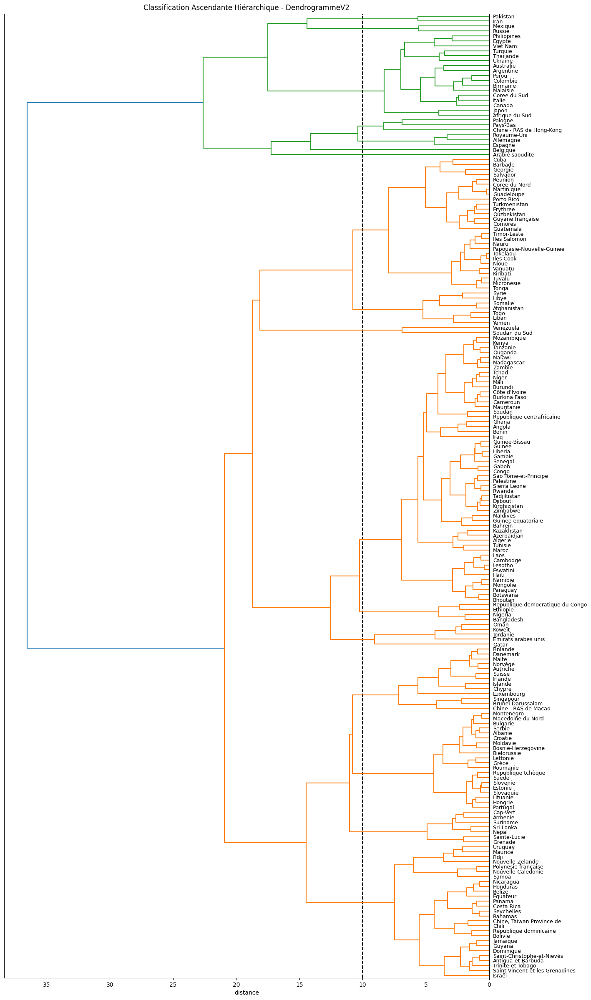

In [44]:
def clust_dendrogramV2(Z,names):  
    plt.figure(figsize=(15,30))    
    plt.axvline(x=10,color="black", linestyle="dashed")   
    plt.axvline(x=210, color ="orange", linestyle="dashed")
    plt.title("Classification Ascendante Hiérarchique - DendrogrammeV2")    
    plt.xlabel("distance")
    dendrogram(               
        Z,                    
        labels = names,       
        truncate_mode="lastp", 
        orientation = "left", 
        p=205,                
        leaf_font_size = 9    
    )
    plt.show()     
X = df_data2.values    
X[np.isinf(X)] = np.nan 
X = np.nan_to_num(X)    
names = df_data2.index 

std_scale = preprocessing.StandardScaler().fit(X)   
    
X_scaled = std_scale.transform(X)

Z = linkage(X_scaled, "ward", metric = "euclidean")          

clust_dendrogramV2(Z,names)

## 4.5 - Dendrogramme sur 7 lignes

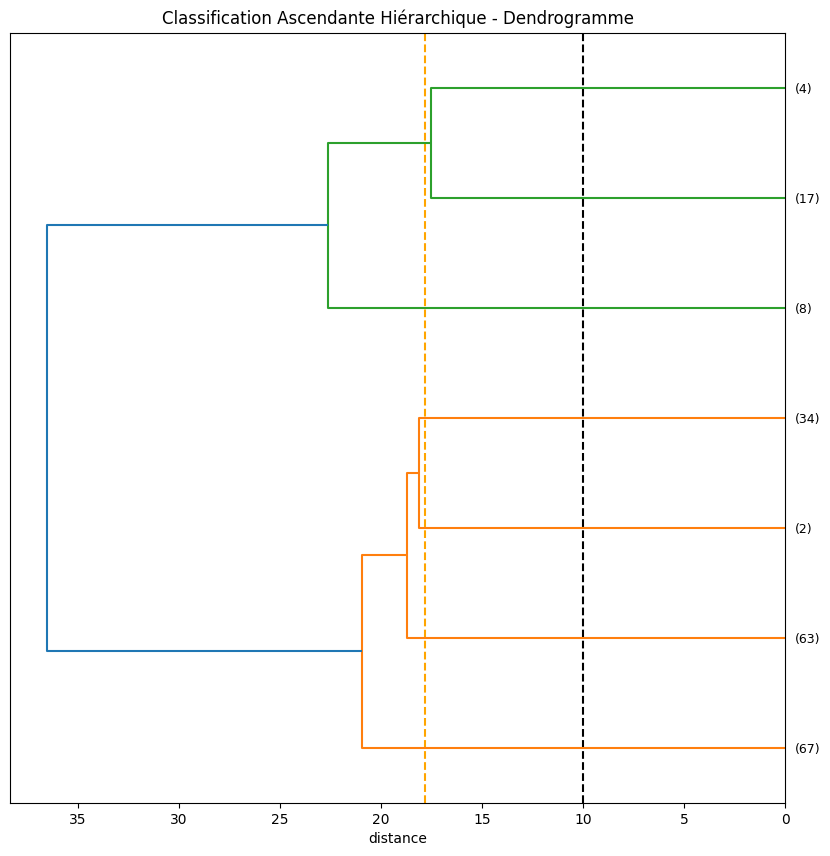

In [45]:
def clust_dendrogram7(Z,names):  
    plt.figure(figsize=(10,10))    
    plt.axvline(x=10,color="black", linestyle="dashed")  
    plt.axvline(x=17.8, color ="orange", linestyle="dashed")
    plt.title("Classification Ascendante Hiérarchique - Dendrogramme")    
    plt.xlabel("distance")
    dendrogram(               
        Z,                    
        labels = names,       
        truncate_mode="lastp",
        orientation = "left", 
        p=7,                
        leaf_font_size = 9    
    )
    plt.show()     
       
clust_dendrogram7(Z,names)

# 5 - Analyse en Composantes Principales (ACP)
## 5.1 - Eboulis des valeurs propres
### 5.1.1 - définition de l'affichage du tracé d'éboulis des valeurs propres

In [46]:
def display_scree_eigenvalues(pca):         # Définit la fonction prenant comme argument "pca", un objet résultant d'une ACP
    scree = pca.explained_variance_ratio_*100   # Calcul des pourcentages d'inertie (variance expliquée) 
    # L'objet "pca" doit avoir un attribut "explained_variance_ratio_" qui contient ces pourcentages.
    plt.bar(np.arange(len(scree))+1, scree)     # Création d'un graphique en barre
    # "np.arange(len(scree))+1" génère une séquence allant de 1 à la longueur de "scree", ce qui correspond aux rangs 
    # des axes d'inertie. Les valeurs de scree sont utilisées comme hauteurs des barres.
    plt.plot(np.arange(len(scree))+1, scree.cumsum(),c = "red", marker ="o")  # - Création d'un courbe cumulative en reliant les
    # points correspondant à la somme cumulée des pourcentages d'inertie.
    # - "scree.cumsum()"" calcule la somme cumulée de scree.
    # - Le paramètre c="red" spécifie que la courbe doit être tracée en rouge. 
    # - marker="o" indique que des marqueurs ronds doivent être utilisés pour chaque point.
    plt.xlabel("rang axe d'inertie")    
    plt.ylabel("% inertie")
    plt.title("Eboulis des valeurs propres")
    plt.show(block = False)

In [47]:
n_comp = 17             # Définission du nombre de composantes principales à conserver.
data_pca = df_data2     # Copie des données de "df_data2" dans la variable "data_pca".

data_pca = data_pca.fillna(0)  # Remplissage des valeurs manquantes par 0.
X=data_pca.values              # Conversion des données en une matrice "X". 
names = df_data2.index         # Création d'une liste "names" contenant les noms (index) des variables dans "df_data2".
features = data_pca.columns    # Création d'une liste "features"  contenant les noms des variables dans "data_pca".

# Centrage - Réduction
std_scale = preprocessing.StandardScaler().fit(X) # Standardisation sur les données "X".
X_scaled = std_scale.transform(X) # Application de la transformation de centrage et réductions aux données "X" vers "X_scaled".
                                  # "X_scaled" devient la version standardisées des données (depuis "df_data2").

# Calcul composantes principales
pca = decomposition.PCA(n_components = n_comp) # Initialisation de PCA avec le nb de composantes principales à conserver (17).                                            
pca.fit(X_scaled) # Calcul de n'analyse PCA en ajustant le modèle aux données standardisées "X_scaled".
                  # --> Transforme les données originales en celles projetées sur les Nlles composantes principales
# Proportion de la variance expliquée

PCA(n_components=17)

In [48]:
poulet = pd.DataFrame(X_scaled,
                     index = df_data2.index,
                     columns = df_data2.columns)

In [49]:
pca.explained_variance_ratio_ # Renvoi d'un tableau contenant la proportion de la variances expliquée par chanque comp. princip.

array([2.70104205e-01, 1.36037616e-01, 9.46151524e-02, 8.21222292e-02,
       6.84189942e-02, 5.97770668e-02, 5.24558528e-02, 4.61105421e-02,
       4.04694215e-02, 3.67518982e-02, 3.60675410e-02, 2.78096148e-02,
       1.95313060e-02, 1.63556015e-02, 1.25208334e-02, 6.34334526e-04,
       2.17789537e-04])

In [50]:
# Cumul de variance expliquée
pca.explained_variance_ratio_.cumsum()

array([0.27010421, 0.40614182, 0.50075697, 0.5828792 , 0.6512982 ,
       0.71107526, 0.76353112, 0.80964166, 0.85011108, 0.88686298,
       0.92293052, 0.95074013, 0.97027144, 0.98662704, 0.99914788,
       0.99978221, 1.        ])

### 5.1.2 - Traçage

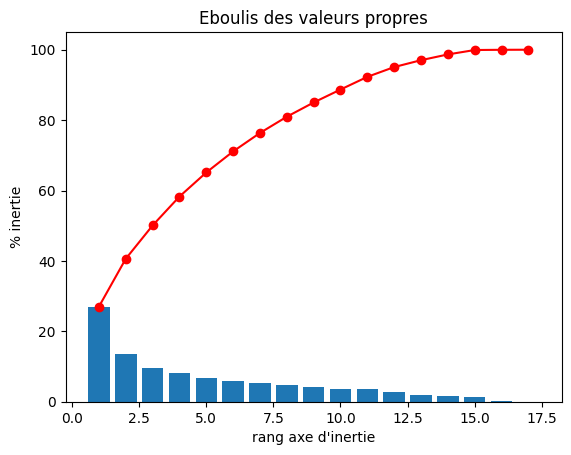

In [51]:
display_scree_eigenvalues(pca)

#### Je vais choisir 6 composantes principales, car ces premières dimensions représentent près de 71 % des informations importantes

In [52]:
# Clustering hiérarchique agglomératif du df "poulet" pour découpage en 6 clusters
clusters = fcluster(Z,6, criterion = "maxclust") #  
classes6 = pd.DataFrame({"cluster": clusters,"pays":names})
print(classes6)

     cluster            pays
0          4     Afghanistan
1          6  Afrique du Sud
2          1         Albanie
3          2         Algerie
4          5       Allemagne
..       ...             ...
190        3       Venezuela
191        6        Viet Nam
192        4           Yemen
193        2          Zambie
194        2        Zimbabwe

[195 rows x 2 columns]


In [53]:
classes6.head()

,cluster,pays
0,4,Afghanistan
1,6,Afrique du Sud
2,1,Albanie
3,2,Algerie
4,5,Allemagne


In [54]:
classes_clust = classes6.set_index("pays")
data_clust6 = pd.merge(poulet, classes6, on=["pays"], how="outer")
result_clustering6 = data_clust6.drop("pays", axis=1).groupby("cluster").mean()
#result_clustering6 = data_clust.groupby("cluster").mean()
result_clustering6
# "result_clustering6" cotient les moyennes des variables standardisées pour chaque cluster

,population,%_evolution_2007/2017,cout_viande_pers/an(USD),PIB_habitant(USD),Tx_inflation,production,cout_production(USD/t),import_tonnes,export_tonnes,importFrance_tonnes,exportFrance_tonnes,emission_co2(tonnes),stabilite,distance_france(km),nourriture,disponibilite_interieure,dispo_alimentaire(kg/pers/an)
cluster,,,,,,,,,,,,,,,,,
1,-0.44,-0.57,0.24,0.50,-0.15,-0.29,0.32,-0.26,-0.16,-0.14,-0.11,-0.23,0.64,-0.17,-0.30,-0.30,0.63
2,0.05,0.87,0.59,-0.40,-0.04,-0.38,-0.29,-0.14,-0.25,-0.09,-0.14,-0.20,-0.43,-0.17,-0.34,-0.32,-0.60
3,0.01,-0.62,-1.72,-0.87,9.14,-0.10,-0.44,-0.34,-0.26,-0.19,-0.14,0.17,-0.61,-0.01,-0.11,-0.07,-0.53
4,-0.39,-0.16,-1.72,-0.61,-0.10,-0.42,-0.10,-0.26,-0.26,-0.15,-0.14,-0.33,-0.29,0.70,-0.40,-0.38,-0.56
5,0.52,-0.50,0.05,1.34,-0.16,1.17,-0.15,2.56,3.55,2.83,3.05,0.34,0.52,-0.99,1.13,0.87,0.36
6,1.70,-0.29,0.39,0.16,-0.04,2.29,0.11,0.73,0.36,-0.12,-0.13,1.73,-0.43,0.28,2.20,2.23,0.61


In [55]:
#print(result_clustering6)

In [56]:
data_clust6.head()

,pays,population,%_evolution_2007/2017,cout_viande_pers/an(USD),PIB_habitant(USD),Tx_inflation,production,cout_production(USD/t),import_tonnes,export_tonnes,importFrance_tonnes,exportFrance_tonnes,emission_co2(tonnes),stabilite,distance_france(km),nourriture,disponibilite_interieure,dispo_alimentaire(kg/pers/an),cluster
0,Afghanistan,0.45,1.28,-1.72,-0.77,-0.03,-0.43,-0.44,-0.21,-0.26,-0.19,-0.14,-0.39,-2.94,-0.20,-0.39,-0.37,-0.96,4
1,Afrique du Sud,1.07,-0.16,0.87,-0.23,-0.03,2.20,1.24,3.35,0.22,-0.19,-0.14,0.96,-0.23,0.53,2.78,2.95,1.33,6
2,Albanie,-0.52,-1.14,1.23,-0.28,-0.11,-0.45,-0.44,-0.30,-0.26,-0.19,-0.14,-0.39,0.48,-1.16,-0.44,-0.42,-0.37,1
3,Algerie,0.62,0.30,0.64,-0.33,-0.08,-0.05,1.38,-0.43,-0.26,-0.19,-0.14,0.70,-0.92,-1.23,-0.04,-0.04,-0.67,2
4,Allemagne,1.84,-0.84,-0.09,1.59,-0.14,1.16,0.78,3.31,2.21,2.31,2.86,0.59,0.71,-1.34,1.82,1.04,-0.35,5


In [57]:
#pd.set_option("display.float_format",'{:.2f}'.format)
#result_clustering6["population"] = result_clustering6["population"].astype(int)
#result_clustering6

In [58]:
result_clustering6.describe()

,population,%_evolution_2007/2017,cout_viande_pers/an(USD),PIB_habitant(USD),Tx_inflation,production,cout_production(USD/t),import_tonnes,export_tonnes,importFrance_tonnes,exportFrance_tonnes,emission_co2(tonnes),stabilite,distance_france(km),nourriture,disponibilite_interieure,dispo_alimentaire(kg/pers/an)
count,6.00,6.00,6.00,6.00,6.00,6.00,6.00,6.00,6.00,6.00,6.00,6.00,6.00,6.00,6.00,6.00,6.00
mean,0.24,-0.21,-0.36,0.02,1.44,0.38,-0.09,0.38,0.50,0.36,0.40,0.25,-0.10,-0.06,0.36,0.34,-0.02
std,0.80,0.56,1.07,0.82,3.77,1.11,0.28,1.14,1.52,1.21,1.30,0.77,0.54,0.56,1.07,1.04,0.61
min,-0.44,-0.62,-1.72,-0.87,-0.16,-0.42,-0.44,-0.34,-0.26,-0.19,-0.14,-0.33,-0.61,-0.99,-0.40,-0.38,-0.60
25%,-0.29,-0.55,-1.27,-0.56,-0.14,-0.36,-0.26,-0.26,-0.26,-0.14,-0.14,-0.23,-0.43,-0.17,-0.33,-0.32,-0.56
50%,0.03,-0.39,0.15,-0.12,-0.07,-0.19,-0.13,-0.20,-0.21,-0.13,-0.14,-0.01,-0.36,-0.09,-0.21,-0.19,-0.09
75%,0.40,-0.19,0.35,0.41,-0.04,0.85,0.06,0.51,0.23,-0.10,-0.12,0.30,0.32,0.21,0.82,0.63,0.54
max,1.70,0.87,0.59,1.34,9.14,2.29,0.32,2.56,3.55,2.83,3.05,1.73,0.64,0.70,2.20,2.23,0.63


## 5.2 - Visualisation des 6 clusters depuis un clustermap

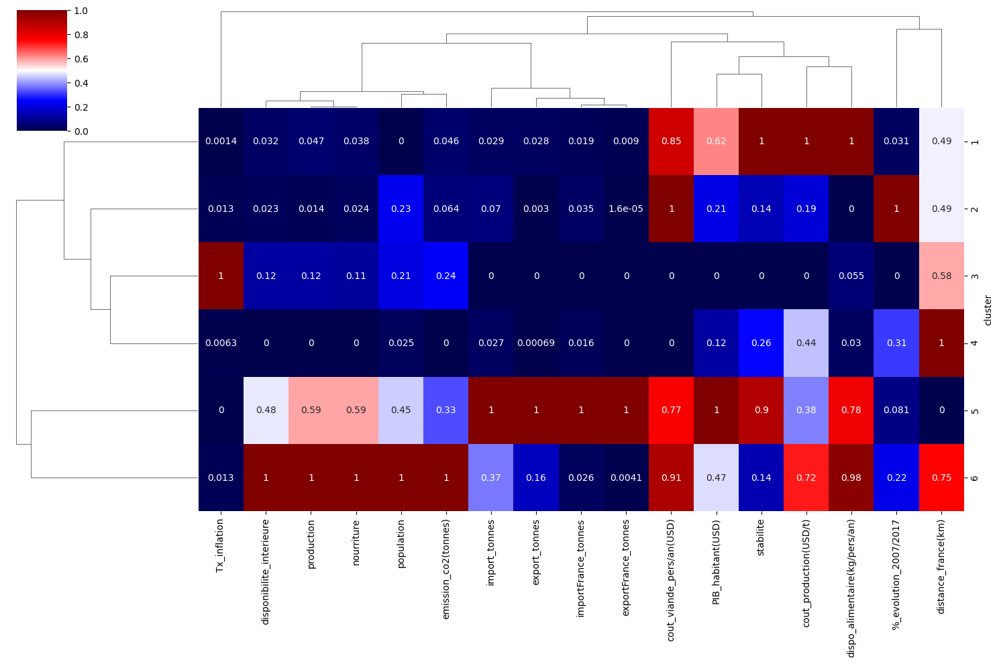

In [59]:
clustermap = sns.clustermap(result_clustering6, figsize = (15,10), annot = True, standard_scale =1, cmap="seismic")
annot_data = clustermap.data2d
df_annot = pd.DataFrame(annot_data)
plt.show()

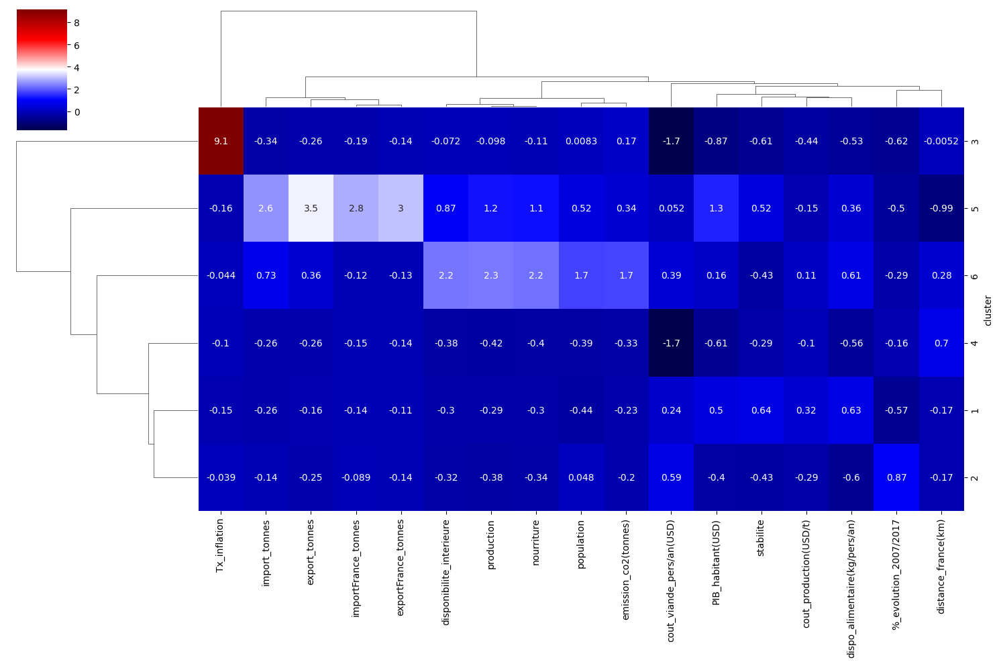

In [60]:
clustermap = sns.clustermap(result_clustering6, figsize = (15,10), annot = True, standard_scale =None, cmap="seismic")
#annot_data = clustermap.data2d
#df_annot = pd.DataFrame(annot_data)
#plt.show()

In [61]:
print(df_annot)

         Tx_inflation  disponibilite_interieure  production  nourriture  \
cluster                                                                   
1                0.00                      0.03        0.05        0.04   
2                0.01                      0.02        0.01        0.02   
3                1.00                      0.12        0.12        0.11   
4                0.01                      0.00        0.00        0.00   
5                0.00                      0.48        0.59        0.59   
6                0.01                      1.00        1.00        1.00   

         population  emission_co2(tonnes)  import_tonnes  export_tonnes  \
cluster                                                                   
1              0.00                  0.05           0.03           0.03   
2              0.23                  0.06           0.07           0.00   
3              0.21                  0.24           0.00           0.00   
4              0.02     

### 5.2.1 -  Détail des clusters
#### 5.2.1.2 - Visualisation des colonnes du df "result_clustering6"

In [62]:
print(result_clustering6.columns)

Index(['population', '%_evolution_2007/2017', 'cout_viande_pers/an(USD)',
       'PIB_habitant(USD)', 'Tx_inflation', 'production',
       'cout_production(USD/t)', 'import_tonnes', 'export_tonnes',
       'importFrance_tonnes', 'exportFrance_tonnes', 'emission_co2(tonnes)',
       'stabilite', 'distance_france(km)', 'nourriture',
       'disponibilite_interieure', 'dispo_alimentaire(kg/pers/an)'],
      dtype='object')


#### 5.2.2.2 - Vérification du type "Series" pour les valeurs des colonnes

In [63]:
for col in result_clustering6.columns:
    if isinstance(result_clustering6[col], pd.Series):
        print(f"{col} est de type Series")
    else:
        print(f"{col} n'est pas de type Series")

population est de type Series
%_evolution_2007/2017 est de type Series
cout_viande_pers/an(USD) est de type Series
PIB_habitant(USD) est de type Series
Tx_inflation est de type Series
production est de type Series
cout_production(USD/t) est de type Series
import_tonnes est de type Series
export_tonnes est de type Series
importFrance_tonnes est de type Series
exportFrance_tonnes est de type Series
emission_co2(tonnes) est de type Series
stabilite est de type Series
distance_france(km) est de type Series
nourriture est de type Series
disponibilite_interieure est de type Series
dispo_alimentaire(kg/pers/an) est de type Series


In [64]:
columns_to_process = result_clustering6.columns

### 5.2.3 - Automatisation de la lecture des résultats de clustering
#### 5.2.3.1 - Répartition, par cluster, des indicateurs en 3 catégories : Fortes, Moyennes, Faibles.

In [65]:
def map_to_categories(value):
     
    if value >= 0.7:
        return "Forte"
    elif value > 0.3 and value < 0.7: 
        return "Moyenne"
    else :
        return "Faible"
    
columns_by_cluster = {}

for col in df_annot.columns: 
    if col in columns_to_process and isinstance(df_annot[col], pd.Series):
        df_annot[col + "_cat"] = df_annot[col].apply(map_to_categories)
    
grouped_data = df_annot.groupby("cluster")

for cluster, group in grouped_data:
    columns_by_cluster[cluster] = {}
    
    for category in ['Forte', 'Moyenne', 'Faible']:
        columns_with_category = [col.replace("_cat", "") for col in group.columns if group[col].iloc[0] == category]
        columns_by_cluster[cluster][category] = columns_with_category

for cluster, columns_dict in columns_by_cluster.items():
        print("\n","cluster {}:".format(cluster))
        for category, columns_list in columns_dict.items():
            print(" valeurs {} : {}".format(category, ", ".join(columns_list)))


 cluster 1:
 valeurs Forte : cout_viande_pers/an(USD), stabilite, cout_production(USD/t), dispo_alimentaire(kg/pers/an)
 valeurs Moyenne : PIB_habitant(USD), distance_france(km)
 valeurs Faible : Tx_inflation, disponibilite_interieure, production, nourriture, population, emission_co2(tonnes), import_tonnes, export_tonnes, importFrance_tonnes, exportFrance_tonnes, %_evolution_2007/2017

 cluster 2:
 valeurs Forte : cout_viande_pers/an(USD), %_evolution_2007/2017
 valeurs Moyenne : distance_france(km)
 valeurs Faible : Tx_inflation, disponibilite_interieure, production, nourriture, population, emission_co2(tonnes), import_tonnes, export_tonnes, importFrance_tonnes, exportFrance_tonnes, PIB_habitant(USD), stabilite, cout_production(USD/t), dispo_alimentaire(kg/pers/an)

 cluster 3:
 valeurs Forte : Tx_inflation
 valeurs Moyenne : distance_france(km)
 valeurs Faible : disponibilite_interieure, production, nourriture, population, emission_co2(tonnes), import_tonnes, export_tonnes, importFr

#### 5.2.3.2 - Répartition, par indicateur, des clusters en 3 catégories de représentativité des valeurs : Fortes, Moyennes, Faibles.

In [66]:
columns_clusters = {column: {"Forte": [], "Moyenne": [], "Faible": []} for column in columns_to_process}

for cluster, columns_dict in columns_by_cluster.items():
    for category, column_list in columns_dict.items():
        for column in column_list:
            columns_clusters[column][category].append(cluster)

def format_columns_clusters_markdown_table(cluster_data):
    markdown = "| Colonnes | Valeurs Fortes (Clusters) | Valeurs Moyennes (Clusters) | Valeurs Faibles (Clusters) |\n"
    markdown += "|:--------:|:------------------------:|:-------------------------:|:-----------------------:|\n"
    for column, clusters_dict in cluster_data.items():
        forte_clusters = ', '.join(str(cluster) for cluster in clusters_dict['Forte'])
        moyenne_clusters = ', '.join(str(cluster) for cluster in clusters_dict['Moyenne'])
        faible_clusters = ', '.join(str(cluster) for cluster in clusters_dict['Faible'])
        markdown += "| {} | {} | {} | {} |\n".format(column, forte_clusters, moyenne_clusters, faible_clusters)
        markdown += "\n"  # Add a newline between each column's rows
    return markdown

print(format_columns_clusters_markdown_table(columns_clusters))


| Colonnes | Valeurs Fortes (Clusters) | Valeurs Moyennes (Clusters) | Valeurs Faibles (Clusters) |
|:--------:|:------------------------:|:-------------------------:|:-----------------------:|
| population | 6 | 5 | 1, 2, 3, 4 |

| %_evolution_2007/2017 | 2 | 4 | 1, 3, 5, 6 |

| cout_viande_pers/an(USD) | 1, 2, 5, 6 |  | 3, 4 |

| PIB_habitant(USD) | 5 | 1, 6 | 2, 3, 4 |

| Tx_inflation | 3 |  | 1, 2, 4, 5, 6 |

| production | 6 | 5 | 1, 2, 3, 4 |

| cout_production(USD/t) | 1, 6 | 4, 5 | 2, 3 |

| import_tonnes | 5 | 6 | 1, 2, 3, 4 |

| export_tonnes | 5 |  | 1, 2, 3, 4, 6 |

| importFrance_tonnes | 5 |  | 1, 2, 3, 4, 6 |

| exportFrance_tonnes | 5 |  | 1, 2, 3, 4, 6 |

| emission_co2(tonnes) | 6 | 5 | 1, 2, 3, 4 |

| stabilite | 1, 5 |  | 2, 3, 4, 6 |

| distance_france(km) | 4, 6 | 1, 2, 3 | 5 |

| nourriture | 6 | 5 | 1, 2, 3, 4 |

| disponibilite_interieure | 6 | 5 | 1, 2, 3, 4 |

| dispo_alimentaire(kg/pers/an) | 1, 5, 6 |  | 2, 3, 4 |




#### 5.2.3.3 - Classement des 3 clusters les mieux représentés, pour chaque indicateur.

In [67]:
colonnes_interet = ['population', '%_evolution_2007/2017', 'cout_viande_pers/an(USD)', 'PIB_habitant(USD)', 
                    'Tx_inflation', 'production', 'cout_production(USD/t)', 'import_tonnes', 'export_tonnes', 
                    'importFrance_tonnes', 'exportFrance_tonnes', 'emission_co2(tonnes)', 'stabilite', 'distance_france(km)', 
                    'nourriture', 'disponibilite_interieure', 'dispo_alimentaire(kg/pers/an)']

for colonne in colonnes_interet:

    colonne_triee = df_annot.sort_values(colonne, ascending=False)
    
    meilleurs_clusters = colonne_triee.index[:3]
    
    labels_clusters = [f"Cluster {i}" for i in meilleurs_clusters]
    
    print(f"L'indicateur \"{colonne}\" est le mieux représenté dans les clusters : {', '.join(labels_clusters)}")


L'indicateur "population" est le mieux représenté dans les clusters : Cluster 6, Cluster 5, Cluster 2
L'indicateur "%_evolution_2007/2017" est le mieux représenté dans les clusters : Cluster 2, Cluster 4, Cluster 6
L'indicateur "cout_viande_pers/an(USD)" est le mieux représenté dans les clusters : Cluster 2, Cluster 6, Cluster 1
L'indicateur "PIB_habitant(USD)" est le mieux représenté dans les clusters : Cluster 5, Cluster 1, Cluster 6
L'indicateur "Tx_inflation" est le mieux représenté dans les clusters : Cluster 3, Cluster 2, Cluster 6
L'indicateur "production" est le mieux représenté dans les clusters : Cluster 6, Cluster 5, Cluster 3
L'indicateur "cout_production(USD/t)" est le mieux représenté dans les clusters : Cluster 1, Cluster 6, Cluster 4
L'indicateur "import_tonnes" est le mieux représenté dans les clusters : Cluster 5, Cluster 6, Cluster 2
L'indicateur "export_tonnes" est le mieux représenté dans les clusters : Cluster 5, Cluster 6, Cluster 1
L'indicateur "importFrance_ton

#### 5.2.3.4 - top 3 clusters pour l'ensemble des indicateurs les plus pertinents (besoins hauts et besoins bas)

In [68]:
meilleures_colonnes = ['population', '%_evolution_2007/2017', 'PIB_habitant(USD)', 'stabilite', 'cout_production(USD/t)', 
                       'import_tonnes', 'nourriture']
moins_bonnes_colonnes = ['cout_viande_pers/an(USD)', 'Tx_inflation', 'production', 'distance_france(km)', 
                         'disponibilite_interieure', 'dispo_alimentaire(kg/pers/an)']

df_annot['moyenne_meilleures'] = df_annot[meilleures_colonnes].mean(axis=1)

df_annot['moyenne_moins_bonnes'] = df_annot[moins_bonnes_colonnes].mean(axis=1)

indices_meilleures = df_annot['moyenne_meilleures'].nlargest(3).index.tolist()
indices_moins_bonnes = df_annot['moyenne_meilleures'].nsmallest(3).index.tolist()

indices_meilleures_moins_bonnes = df_annot['moyenne_moins_bonnes'].nlargest(3).index.tolist()
indices_moins_bonnes_moins_bonnes = df_annot['moyenne_moins_bonnes'].nsmallest(3).index.tolist()

meilleurs_clusters = [str(cluster) for cluster in indices_meilleures]
moins_bons_clusters = [str(cluster) for cluster in indices_moins_bonnes]
meilleurs_clusters_moins_bons = [str(cluster) for cluster in indices_meilleures_moins_bonnes]
moins_bons_clusters_moins_bons = [str(cluster) for cluster in indices_moins_bonnes_moins_bonnes]

phrase_finale = f"Les 3 clusters ayant les meilleures moyennes sur les colonnes \"{', '.join(meilleures_colonnes)}\" sont les clusters \"{', '.join(meilleurs_clusters)}\".\n" \
               f"Les 3 clusters ayant les meilleures moyennes sur les colonnes \"{', '.join(moins_bonnes_colonnes)}\" sont les clusters \"{', '.join(meilleurs_clusters_moins_bons)}\"."

print(phrase_finale)

Les 3 clusters ayant les meilleures moyennes sur les colonnes "population, %_evolution_2007/2017, PIB_habitant(USD), stabilite, cout_production(USD/t), import_tonnes, nourriture" sont les clusters "5, 6, 1".
Les 3 clusters ayant les meilleures moyennes sur les colonnes "cout_viande_pers/an(USD), Tx_inflation, production, distance_france(km), disponibilite_interieure, dispo_alimentaire(kg/pers/an)" sont les clusters "6, 5, 1".


In [69]:
df_annot

,Tx_inflation,disponibilite_interieure,production,nourriture,population,emission_co2(tonnes),import_tonnes,export_tonnes,importFrance_tonnes,exportFrance_tonnes,...,exportFrance_tonnes_cat,cout_viande_pers/an(USD)_cat,PIB_habitant(USD)_cat,stabilite_cat,cout_production(USD/t)_cat,dispo_alimentaire(kg/pers/an)_cat,%_evolution_2007/2017_cat,distance_france(km)_cat,moyenne_meilleures,moyenne_moins_bonnes
cluster,,,,,,,,,,,,,,,,,,,,,
1,0.00,0.03,0.05,0.04,0.00,0.05,0.03,0.03,0.02,0.01,...,Faible,Forte,Moyenne,Forte,Forte,Forte,Faible,Moyenne,0.39,0.40
2,0.01,0.02,0.01,0.02,0.23,0.06,0.07,0.00,0.04,0.00,...,Faible,Forte,Faible,Faible,Faible,Faible,Forte,Moyenne,0.27,0.26
3,1.00,0.12,0.12,0.11,0.21,0.24,0.00,0.00,0.00,0.00,...,Faible,Faible,Faible,Faible,Faible,Faible,Faible,Moyenne,0.05,0.31
4,0.01,0.00,0.00,0.00,0.02,0.00,0.03,0.00,0.02,0.00,...,Faible,Faible,Faible,Faible,Moyenne,Faible,Moyenne,Forte,0.17,0.17
5,0.00,0.48,0.59,0.59,0.45,0.33,1.00,1.00,1.00,1.00,...,Forte,Forte,Forte,Forte,Moyenne,Forte,Faible,Faible,0.63,0.44
6,0.01,1.00,1.00,1.00,1.00,1.00,0.37,0.16,0.03,0.00,...,Faible,Forte,Moyenne,Faible,Forte,Forte,Faible,Forte,0.56,0.78


### 5.2.4 - Listing des clusters

In [70]:
df_par_cluster6 = {}
for cluster in classes6["cluster"].unique():
    cluster_df6 = classes6[classes6["cluster"] == cluster].copy()
    nom_df6 = f"cluster{cluster}"
    df_par_cluster6[nom_df6] = cluster_df6
    
for nom_df6, df_clust6 in df_par_cluster6.items():
    print(f"cluster {nom_df6}:")
    print(df_clust6)
    print()

cluster cluster4:
     cluster                       pays
0          4                Afghanistan
16         4                    Barbade
39         4                    Comores
44         4                       Cuba
49         4                   Salvador
52         4                   Erythree
62         4                    Georgie
66         4                 Guadeloupe
67         4                  Guatemala
72         4           Guyane française
76         4                  Iles Cook
77         4               Iles Salomon
90         4                   Kiribati
94         4                      Liban
96         4                      Libye
107        4                 Martinique
111        4                 Micronesie
117        4                      Nauru
122        4                      Nioue
128        4                Ouzbekistan
132        4  Papouasie-Nouvelle-Guinee
139        4                 Porto Rico
142        4                      Syrie
149        4          

## Cluster 1 ( 67 pays)

In [71]:
df_par_cluster6["cluster1"] .head()

,cluster,pays
2,1,Albanie
6,1,Antigua-et-Barbuda
9,1,Armenie
11,1,Autriche
13,1,Bahamas


In [72]:
print(df_par_cluster6["cluster1"], 'nb_pays:', len(df_par_cluster6["cluster1"]), df_par_cluster6["cluster1"]["pays"].tolist())

     cluster                pays
2          1             Albanie
6          1  Antigua-et-Barbuda
9          1             Armenie
11         1            Autriche
13         1             Bahamas
..       ...                 ...
172        1              Suisse
173        1            Suriname
176        1  Republique tchèque
182        1   Trinite-et-Tobago
188        1             Uruguay

[67 rows x 2 columns] nb_pays: 67 ['Albanie', 'Antigua-et-Barbuda', 'Armenie', 'Autriche', 'Bahamas', 'Bielorussie', 'Belize', 'Bolivie', 'Bosnie-Herzegovine', 'Brunei Darussalam', 'Bulgarie', 'Cap-Vert', 'Chili', 'Chine - RAS de Macao', 'Chine, Taiwan Province de', 'Chypre', 'Costa Rica', 'Croatie', 'Danemark', 'Dominique', 'Equateur', 'Estonie', 'Fidji', 'Finlande', 'Grèce', 'Grenade', 'Guyana', 'Honduras', 'Hongrie', 'Irlande', 'Islande', 'Israël', 'Jamaïque', 'Lettonie', 'Lituanie', 'Luxembourg', 'Macedoine du Nord', 'Malte', 'Maurice', 'Montenegro', 'Nepal', 'Nicaragua', 'Norvège', 'Nouvelle

## Cluster 2 (63 pays)

In [73]:
df_par_cluster6["cluster2"] .head()

,cluster,pays
3,2,Algerie
5,2,Angola
12,2,Azerbaïdjan
14,2,Bahreïn
15,2,Bangladesh


In [74]:
print(df_par_cluster6["cluster2"], 'nb_pays:', len(df_par_cluster6["cluster2"]), df_par_cluster6["cluster2"]["pays"].tolist())

     cluster         pays
3          2      Algerie
5          2       Angola
12         2  Azerbaïdjan
14         2      Bahreïn
15         2   Bangladesh
..       ...          ...
174        2  Tadjikistan
175        2        Tchad
183        2      Tunisie
193        2       Zambie
194        2     Zimbabwe

[63 rows x 2 columns] nb_pays: 63 ['Algerie', 'Angola', 'Azerbaïdjan', 'Bahreïn', 'Bangladesh', 'Benin', 'Bhoutan', 'Botswana', 'Burkina Faso', 'Burundi', 'Cambodge', 'Cameroun', 'Congo', "Côte d'Ivoire", 'Djibouti', 'Emirats arabes unis', 'Eswatini', 'Ethiopie', 'Gabon', 'Gambie', 'Ghana', 'Guinee', 'Guinee equatoriale', 'Guinee-Bissau', 'Haïti', 'Iraq', 'Jordanie', 'Kazakhstan', 'Kenya', 'Kirghizistan', 'Koweït', 'Lesotho', 'Liberia', 'Madagascar', 'Malawi', 'Maldives', 'Mali', 'Maroc', 'Mauritanie', 'Mongolie', 'Mozambique', 'Namibie', 'Niger', 'Nigeria', 'Oman', 'Ouganda', 'Palestine', 'Paraguay', 'Qatar', 'Republique centrafricaine', 'Republique democratique du Congo', 'Lao

## Cluster 3 (2 pays)

In [75]:
df_par_cluster6["cluster3"] .head()

,cluster,pays
169,3,Soudan du Sud
190,3,Venezuela


In [76]:
print(df_par_cluster6["cluster3"], 'nb_pays:', len(df_par_cluster6["cluster3"]), df_par_cluster6["cluster3"]["pays"].tolist())

     cluster           pays
169        3  Soudan du Sud
190        3      Venezuela nb_pays: 2 ['Soudan du Sud', 'Venezuela']


## Cluster 4 (34 pays)

In [77]:
df_par_cluster6["cluster4"] .head()

,cluster,pays
0,4,Afghanistan
16,4,Barbade
39,4,Comores
44,4,Cuba
49,4,Salvador


In [78]:
print(df_par_cluster6["cluster4"], 'nb_pays:', len(df_par_cluster6["cluster4"]), df_par_cluster6["cluster4"]["pays"].tolist())

     cluster                       pays
0          4                Afghanistan
16         4                    Barbade
39         4                    Comores
44         4                       Cuba
49         4                   Salvador
52         4                   Erythree
62         4                    Georgie
66         4                 Guadeloupe
67         4                  Guatemala
72         4           Guyane française
76         4                  Iles Cook
77         4               Iles Salomon
90         4                   Kiribati
94         4                      Liban
96         4                      Libye
107        4                 Martinique
111        4                 Micronesie
117        4                      Nauru
122        4                      Nioue
128        4                Ouzbekistan
132        4  Papouasie-Nouvelle-Guinee
139        4                 Porto Rico
142        4                      Syrie
149        4              Coree du Nord


## Cluster 5 (8 pays)

In [79]:
df_par_cluster6["cluster5"] .head()

,cluster,pays
4,5,Allemagne
7,5,Arabie saoudite
18,5,Belgique
34,5,Chine - RAS de Hong-Kong
53,5,Espagne


In [80]:
print(df_par_cluster6["cluster5"], 'nb_pays:', len(df_par_cluster6["cluster5"]), df_par_cluster6["cluster5"]["pays"].tolist())

     cluster                      pays
4          5                 Allemagne
7          5           Arabie saoudite
18         5                  Belgique
34         5  Chine - RAS de Hong-Kong
53         5                   Espagne
134        5                  Pays-Bas
137        5                   Pologne
153        5               Royaume-Uni nb_pays: 8 ['Allemagne', 'Arabie saoudite', 'Belgique', 'Chine - RAS de Hong-Kong', 'Espagne', 'Pays-Bas', 'Pologne', 'Royaume-Uni']


## Cluster 6 (21 pays)

In [81]:
df_par_cluster6["cluster6"] .head()

,cluster,pays
1,6,Afrique du Sud
8,6,Argentine
10,6,Australie
32,6,Canada
38,6,Colombie


In [82]:
print(df_par_cluster6["cluster6"], 'nb_pays:', len(df_par_cluster6["cluster6"]), df_par_cluster6["cluster6"]["pays"].tolist())

     cluster            pays
1          6  Afrique du Sud
8          6       Argentine
10         6       Australie
32         6          Canada
38         6        Colombie
48         6          Egypte
57         6          Russie
78         6            Iran
83         6          Italie
85         6           Japon
101        6        Malaisie
110        6         Mexique
115        6        Birmanie
129        6        Pakistan
135        6           Perou
136        6     Philippines
144        6    Coree du Sud
177        6       Thaïlande
185        6         Turquie
187        6         Ukraine
191        6        Viet Nam nb_pays: 21 ['Afrique du Sud', 'Argentine', 'Australie', 'Canada', 'Colombie', 'Egypte', 'Russie', 'Iran', 'Italie', 'Japon', 'Malaisie', 'Mexique', 'Birmanie', 'Pakistan', 'Perou', 'Philippines', 'Coree du Sud', 'Thaïlande', 'Turquie', 'Ukraine', 'Viet Nam']


## 5.3 - Définition de l'affichage 
### 5.3.1 - Cercles de corrélations

In [83]:

def display_circles(pcs, n_comp, pca, axis_ranks, labels=None, label_rotation=0, lims=None):
    for d1, d2 in axis_ranks:
        if d2 < n_comp:
            fig, ax = plt.subplots(figsize=(8, 8))  # Initialisation de la figure
            
            if lims is not None:  # Délimitation du graphique
                xmin, xmax, ymin, ymax = lims
            elif pcs.shape[1] < 30:
                xmin, xmax, ymin, ymax = -1, 1, -1, 1
            else:
                xmin, xmax, ymin, ymax = min(pcs[d1, :]), max(pcs[d1, :]), min(pcs[d2, :]), max(pcs[d2, :])

            # Affichage des flèches (limite de 30. Au delà, disparition des triangles aux extrémités)
            if pcs.shape[1] < 30:
                plt.quiver(np.zeros(pcs.shape[1]), np.zeros(pcs.shape[1]),
                           pcs[d1, :], pcs[d2, :],
                           angles="xy", scale_units="xy", scale=1, color="orange", linewidths =0.3)
            else:
                lines = [[[0, 0], [x, y]] for x, y in pcs[[d1, d2]].T]
                ax.add_collection(LineCollection(lines, axes=ax, alpha=.1, color="black"))

            # Affichage noms des variables
            if labels is not None:               
                for i, (x, y) in enumerate(pcs[[d1, d2]].T):
                    if x >= xmin and x <= xmax and y >= ymin and y <= ymax:
                        text = plt.text(x, y, labels[i], fontsize="12", ha="center", va="center", rotation=label_rotation,
                                 color="blue", alpha=0.6)      

            # Affichage lignes (horiz. et vert.)
            plt.plot([-1, 1], [0, 0], color="gray", ls="--")
            plt.plot([0, 0], [-1, 1], color="gray", ls="--")

            # Affichage cercle
            circle = plt.Circle((0, 0), 1, facecolor="none", edgecolor="b")
            plt.gca().add_artist(circle)

            # Limites graphique
            plt.xlim(xmin, xmax)
            plt.ylim(ymin, ymax)

            # Noms des axes +explication du % d'inertie
            plt.xlabel("F{} ({}%)".format(d1 + 1, round(100 * pca.explained_variance_ratio_[d1], 1)))
            plt.ylabel("F{} ({}%)".format(d2 + 1, round(100 * pca.explained_variance_ratio_[d2], 1)))

            # Titre du graphique
            plt.title("Cercle des corrélations (F{} et F{})".format(d1 + 1, d2 + 1))
            plt.show(block=False)

### 5.2.2 - des plans factoriels

In [84]:
def display_factorial_planes (X_projected, n_comp, pca, axis_ranks, labels = 'None', alpha = 1, illustrative_var = None):
    for d1, d2 in axis_ranks:
        if d2 < n_comp :
            fig = plt.figure(figsize = (8,8))
            
            # Affichage points
            if illustrative_var is None :
                plt.scatter(X_projected[:, d1], X_projected[:, d2], alpha = alpha)
            else :
                illustrative_var = np.array(illustrative_var)
                for value in np.unique(illustrative_var):
                    selected = np.where(illustrative_var == value)
                    plt.scatter (X_projected[selected, d1],X_projected[selected, d2], alpha = alpha, label = value)
                plt.legend()
                
            # Affichage labels des points
            if labels is not None :
                for i, (x, y) in enumerate(X_projected[:,[d1, d2]]):
                    plt.text(x, y, labels[1],
                            fontsize = "8", ha = "center", va = "center")
            
            # Noms des axes +explication du % d'inertie
            plt.xlabel("F{} ({}%)".format(d1+1, round(100*pca.explained_variance_ratio_[d1], 1)))
            plt.ylabel("F{} ({}%)".format(d2+1, round(100*pca.explained_variance_ratio_[d2], 1)))
                     
            # Affichage lignes verticales et horizontales
            plt.plot([-100, 100], [0, 0], color = "gray", ls = "--")
            plt.plot([0, 0], [-100, 100], color = "gray", ls = "--")
            
            # Limitation graphique
            boundary = np.max(np.abs(X_projected[:,[d1, d2]])) *1.1
            plt.xlim([-boundary, boundary])
            plt.ylim([-boundary, boundary])
            
            plt.title("Projection des individus (sur F{} et F{})".format(d1+1, d2+1))
            plt.show()

# 6 - Affichage des cercles des corrélations et plans factoriels
## 6.1 - Composantes F1 et F2

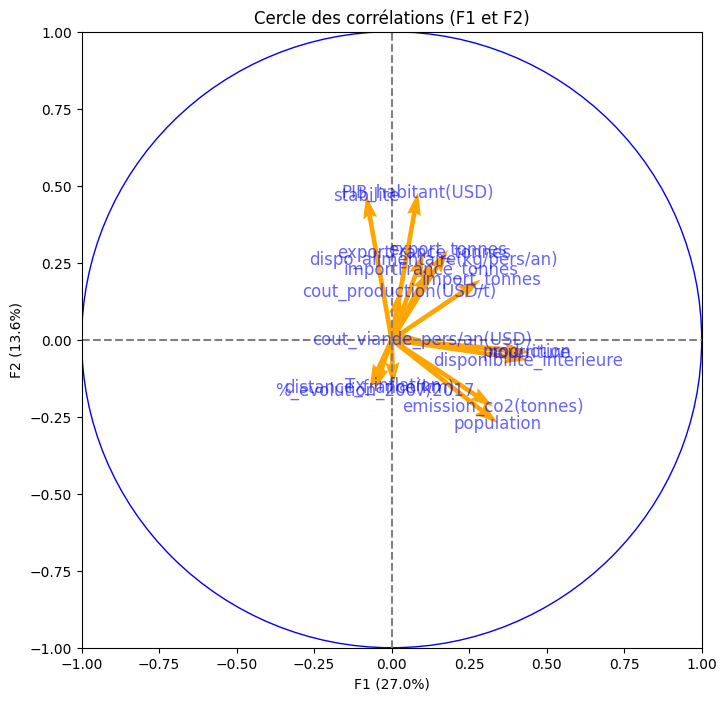

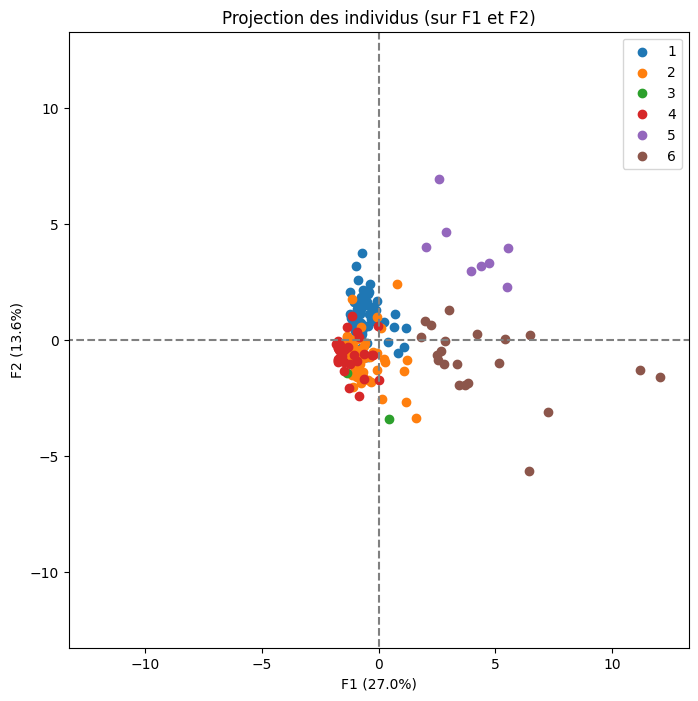

In [85]:
features = poulet.columns
pcs = pca.components_
display_circles(pcs, n_comp, pca, [(0,1)], labels = np.array(features))

X_projected = pca.transform(poulet)
display_factorial_planes(X_projected, n_comp, pca, [(0,1)], labels =None, alpha=1, illustrative_var=clusters)

plt.show()

## 6.2 - Composantes F3 et F4

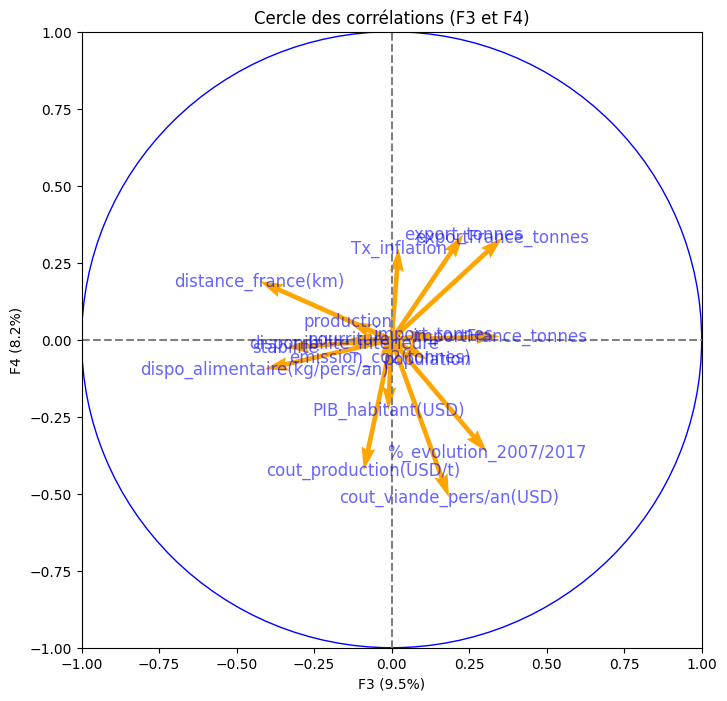

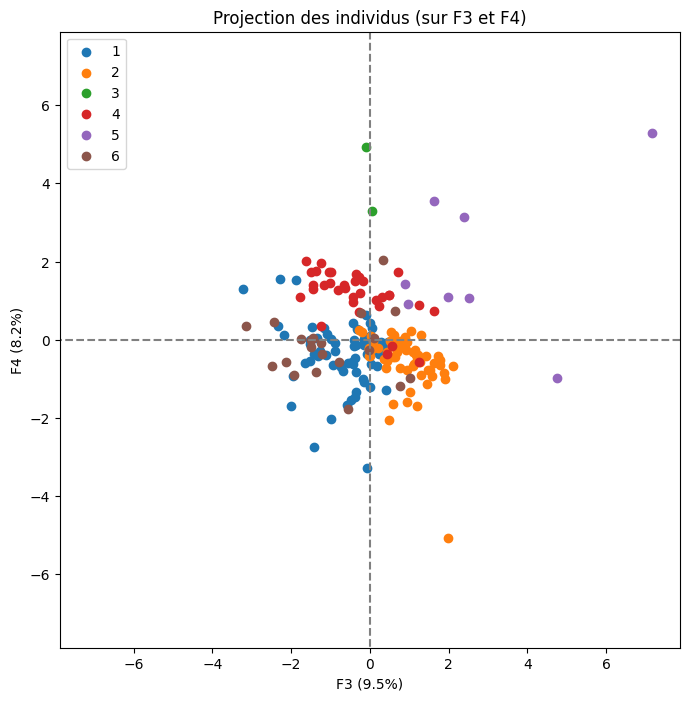

In [86]:
features = poulet.columns
pcs = pca.components_
display_circles(pcs, n_comp, pca, [(2,3)], labels = np.array(features))
X_projected = pca.transform(poulet)
display_factorial_planes(X_projected, n_comp, pca, [(2,3)], labels =None, alpha=1, illustrative_var=clusters)
plt.show()

## 6.3 - Composantes F5 et F6

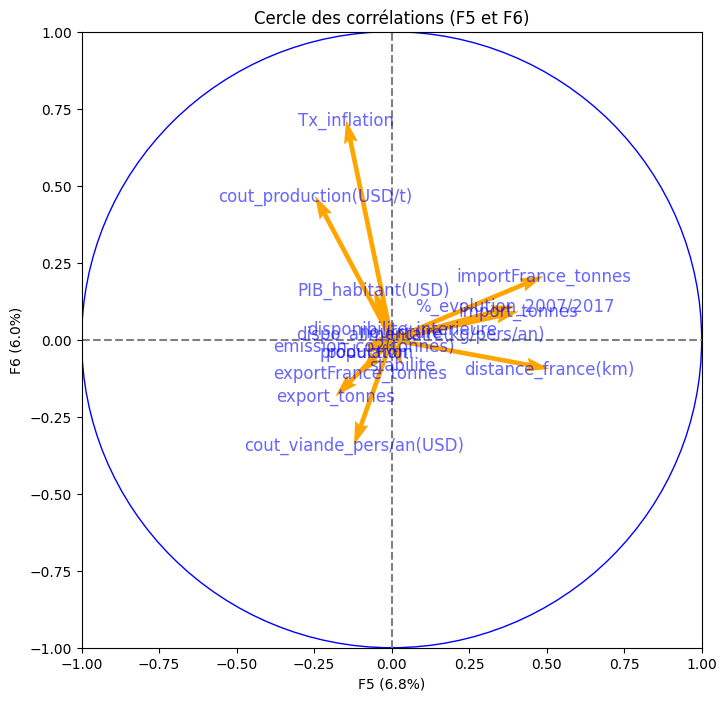

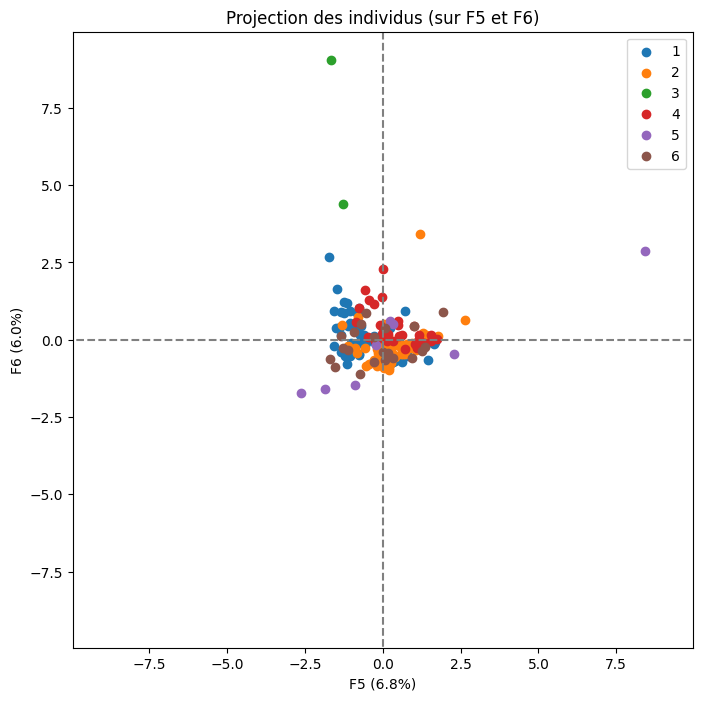

In [87]:
features = poulet.columns
pcs = pca.components_
display_circles(pcs, n_comp, pca, [(4,5)], labels = np.array(features))
X_projected = pca.transform(poulet)
display_factorial_planes(X_projected, n_comp, pca, [(4,5)], labels =None, alpha=1, illustrative_var=clusters)
plt.show()

## 6.4 - Diagrammes de Kiviat

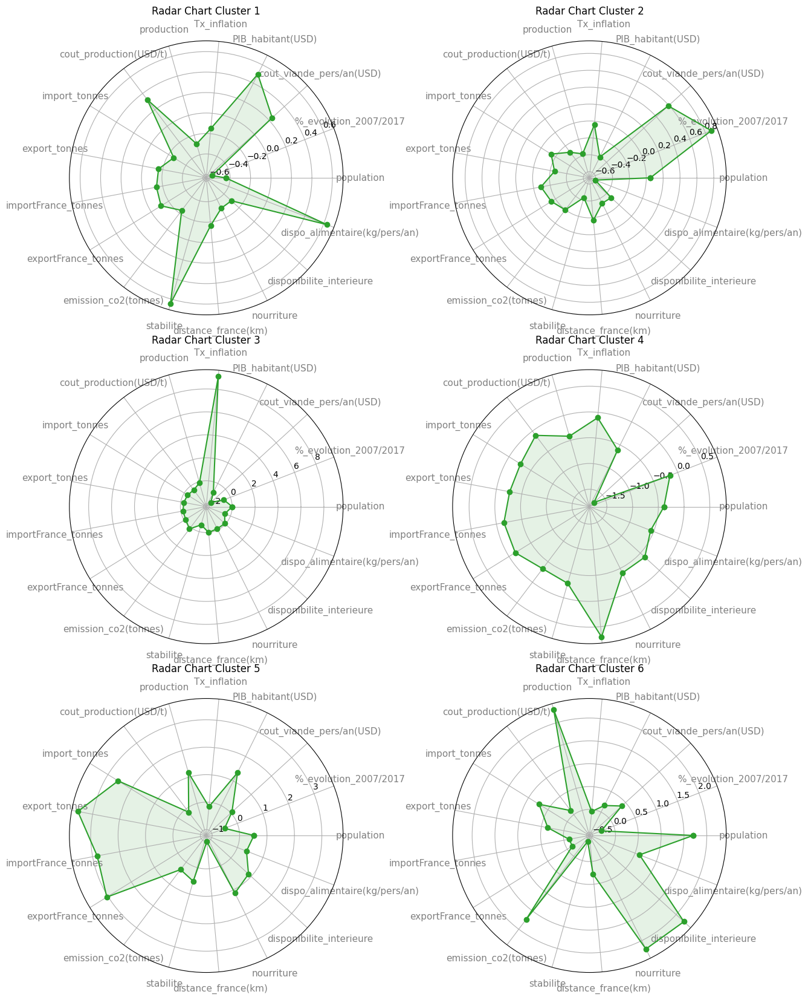

In [88]:
# Création des DataFrames kiviat
kiviats = []
for i in range(6):
    kiviat_df = pd.DataFrame({
        "Col A": ['population', '%_evolution_2007/2017', 'cout_viande_pers/an(USD)', 'PIB_habitant(USD)', 'Tx_inflation', 'production',
                  'cout_production(USD/t)', 'import_tonnes', 'export_tonnes', 'importFrance_tonnes', 'exportFrance_tonnes',
                  'emission_co2(tonnes)', 'stabilite', 'distance_france(km)', 'nourriture', 'disponibilite_interieure',
                  'dispo_alimentaire(kg/pers/an)'],
        "Col B": result_clustering6.iloc[i].values
    })
    kiviats.append(kiviat_df)

# Création de la figure
fig = plt.figure(figsize=(15, 20))
fig.tight_layout()

# Boucle pour les sous-graphiques
for i in range(6):
    ax = fig.add_subplot(3, 2, i+1, projection="polar")
    theta = np.arange(len(kiviats[i])+1) / float(len(kiviats[i])) * 2 * np.pi
    values = kiviats[i]["Col B"].values
    values = np.append(values, values[0])
    l1, = ax.plot(theta, values, color="C2", marker="o", label="Nom Col B")
    plt.xticks(theta[:-1], kiviats[i]["Col A"], color="grey", size=11)
    ax.tick_params(pad=10)
    ax.fill(theta, values, "green", alpha=0.1)
    plt.title(f"Radar Chart Cluster {i+1}")

plt.show()


### Dans un premier temps, je sais déjà que je peux écarter les cluster 2 ,3 et 4. 

# 7- K-Means

In [89]:
df_imputed = df_data2.copy() 

#Boucle sur les colonnes avec des valeurs manquantes
for column in df_imputed.columns[df_imputed.isnull().any()]:
    #Variables X et y pour la régression linéaire
    X = df_imputed.drop(column, axis=1)  # Toutes les colonnes sauf celle à imputer
    y = df_imputed[column]  # Colonne à imputer
    
    #Séparation des données en ensembles d'entraînement et de test
    X_train = X[y.notnull()]  # Données non manquantes
    y_train = y[y.notnull()]  # Valeurs correspondantes non manquantes
    X_test = X[y.isnull()]  # Données manquantes
    
    #Création et ajustement du modèle de régression linéaire
    model = LinearRegression()
    model.fit(X_train, y_train)
    
    #Prédiction des valeurs manquantes
    y_pred = model.predict(X_test)
    
    #Imputation des valeurs manquantes dans la colonne correspondante
    df_imputed.loc[y.isnull(), column] = y_pred

df_imputed.head()


,population,%_evolution_2007/2017,cout_viande_pers/an(USD),PIB_habitant(USD),Tx_inflation,production,cout_production(USD/t),import_tonnes,export_tonnes,importFrance_tonnes,exportFrance_tonnes,emission_co2(tonnes),stabilite,distance_france(km),nourriture,disponibilite_interieure,dispo_alimentaire(kg/pers/an)
pays,,,,,,,,,,,,,,,,,
Afghanistan,35643418,37.60,0.00,2058.40,6.96,27850.00,0.00,28937.00,36.99,0.00,0.00,10057.70,-2.80,5598,64000,63514.00,1.82
Afrique du Sud,56641209,13.29,386.54,13860.30,6.90,1658159.00,2016.60,480345.55,58258.84,0.08,0.00,571841.10,-0.28,8654,2110000,2070000.00,36.14
Albanie,2879355,-3.25,439.46,12771.00,3.92,12912.00,0.00,17515.47,0.00,0.00,0.00,10486.40,0.38,1605,33000,30192.00,10.58
Algerie,41136546,21.05,351.86,11737.40,5.04,262965.00,2180.70,0.40,0.00,0.00,0.00,461881.70,-0.92,1338,286000,262965.00,6.20
Allemagne,82624374,1.77,243.09,53071.50,2.76,1009565.00,1459.50,474950.63,300560.64,19245.40,32492.09,415700.30,0.59,882,1492000,913829.00,10.95


In [90]:
imputer = SimpleImputer(strategy="mean")
column_to_impute = "stabilite"

df_imputed = df_data2.copy()

X = df_imputed.drop(column_to_impute, axis=1)
y = df_imputed[column_to_impute]

X_imputed = imputer.fit_transform(X)

df_imputed[X.columns] = X_imputed
scaler = StandardScaler()
X_scaled = scaler.fit_transform(df_imputed)

pca = PCA(n_components = 2)
X_reduced = pca.fit_transform(X_imputed)

df_X_reduced = pd.DataFrame(X_reduced,index = df_imputed.index)

In [91]:
df_X_reduced.head()

,0,1
pays,,
Afghanistan,15300108.06,-774610.07
Afrique du Sud,36365122.70,2125498.69
Albanie,-17456920.33,-117471.25
Algerie,20803310.98,-455944.61
Allemagne,62312378.12,181648.32


In [92]:
def cluster(n_clusters):
    kmeans = KMeans(n_clusters=n_clusters, n_init=10)
    kmeans.fit(X_reduced)
    Z = kmeans.predict(X_reduced)
    return kmeans, Z

#max_clusters = len(df_X_reduced)
max_clusters = 20
inerties = np.zeros(max_clusters)

for i in range(1, max_clusters):
    kmeans, Z = cluster(i)
    inerties[i] = kmeans.inertia_

data_kmeans = pgo.Scatter(
    x=np.arange(1, max_clusters),
    y=inerties[1:]
)

layout1 = pgo.Layout(
    title="k-means clustering",
    xaxis=pgo.layout.XAxis(title="Nb clusters", range=[0, max_clusters]),
    yaxis=pgo.layout.YAxis(title="Inertie")
)

fig1 = pgo.Figure(data=data_kmeans, layout=layout1)
iplot(fig1, filename="clustering-inerties")


### En appliquant la méthode du coude et ayant sélectionné 3 clusters à écarter, je sélectionne 3 clusters

# 8 - Travail sur les 3 clusters restants
## 8.1 - Création du dataframe "df_data3" à partir de "df_data2" en filtrant les clusters depuis "data_clust6"

In [93]:
# Création du dataframe df_data3 à partir de df_data2 en filtrant les lignes
df_data2.reset_index(inplace = True)
df_data2.rename(columns={"index" : "pays"}, inplace = True)
clusters_to_remove = [2, 3, 4]
df
df_data3 = df_data2[~df_data2["pays"].isin(data_clust6[data_clust6["cluster"].isin(clusters_to_remove)]["pays"])].copy()
df_data3.info()

<class 'pandas.core.frame.DataFrame'>
Index: 96 entries, 1 to 191
Data columns (total 18 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   pays                           96 non-null     object 
 1   population                     96 non-null     int64  
 2   %_evolution_2007/2017          96 non-null     float64
 3   cout_viande_pers/an(USD)       96 non-null     float64
 4   PIB_habitant(USD)              96 non-null     float64
 5   Tx_inflation                   96 non-null     float64
 6   production                     96 non-null     float64
 7   cout_production(USD/t)         96 non-null     float64
 8   import_tonnes                  96 non-null     float64
 9   export_tonnes                  96 non-null     float64
 10  importFrance_tonnes            96 non-null     float64
 11  exportFrance_tonnes            96 non-null     float64
 12  emission_co2(tonnes)           96 non-null     float64
 

In [94]:
df_data3.head()

,pays,population,%_evolution_2007/2017,cout_viande_pers/an(USD),PIB_habitant(USD),Tx_inflation,production,cout_production(USD/t),import_tonnes,export_tonnes,importFrance_tonnes,exportFrance_tonnes,emission_co2(tonnes),stabilite,distance_france(km),nourriture,disponibilite_interieure,dispo_alimentaire(kg/pers/an)
1,Afrique du Sud,56641209,13.29,386.54,13860.30,6.90,1658159.00,2016.60,480345.55,58258.84,0.08,0.00,571841.10,-0.28,8654,2110000,2070000.00,36.14
2,Albanie,2879355,-3.25,439.46,12771.00,3.92,12912.00,0.00,17515.47,0.00,0.00,0.00,10486.40,0.38,1605,33000,30192.00,10.58
4,Allemagne,82624374,1.77,243.09,53071.50,2.76,1009565.00,1459.50,474950.63,300560.64,19245.40,32492.09,415700.30,0.59,882,1492000,913829.00,10.95
6,Antigua-et-Barbuda,91119,11.10,248.93,19840.30,1.87,96.00,0.00,6143.69,7.92,0.00,0.00,400.50,0.75,6708,5000,5171.00,54.02
7,Arabie saoudite,34193122,29.52,376.32,47306.20,-0.82,540258.00,0.00,730959.60,37415.41,97485.32,0.00,670946.20,-0.64,4694,1259000,1233802.00,37.23


### Le nouveau dataframe ne contient plus que 96 pays

In [95]:
null_stability = df_data3[df_data3["stabilite"].isnull()]
print(null_stability)

                          pays  population  %_evolution_2007/2017  \
36   Chine, Taiwan Province de    23665024                   3.15   
113                 Montenegro      632438                   0.08   
124         Nouvelle-Caledonie      284349                  14.03   
138        Polynesie française      295450                   6.21   
152                   Roumanie    19698853                  -5.04   
161                     Serbie     7464880                  -3.78   

     cout_viande_pers/an(USD)  PIB_habitant(USD)  Tx_inflation  production  \
36                     332.52               0.00          0.00   558000.00   
113                    314.63           19682.30          1.74     3650.00   
124                      0.00               0.00          1.42      880.00   
138                      0.00               0.00          1.82      686.00   
152                    344.92           27141.90          2.48   436040.00   
161                    364.27           16611.00

## 8.2 - Matrice de corrélation sur le nouveau df

In [96]:
df_data3 = df_data3.set_index("pays")

In [97]:
df = df_data3
df = df.dropna()
df = df.replace([np.inf, -np.inf], np.finfo(np.float64).max)

x = df.columns.tolist()
z =df[x].corr()

hovercell = list()
for yi, yy in enumerate(x):
    hovercell.append(list())
    for xi, xx in enumerate(x):
        hovercell[-1].append("X: {}<br />Y: {}<br />Corr:{}".format(xx, yy, round(stats.pearsonr(df[xx],df[yy])[0],2)))
        
map = [go.Heatmap(z=z, x=x, y=x,
                 xgap=1, ygap=1,
                 colorbar_thickness=20,
                 colorbar_ticklen=3,
                 hoverinfo='text',
                 text=hovercell)] 
                 
title = "Matrice de corrélation"

layout = go.Layout(title_text=title, title_x=0.5,
                   width= 950, height = 800,
                   xaxis_showgrid = False,
                   yaxis_showgrid = False, 
                   yaxis_autorange = "reversed")

fig = go.Figure(data = map, layout = layout)
iplot(fig, filename = "pandas-heatmap") 

## 8.3 - Dendrogramme 

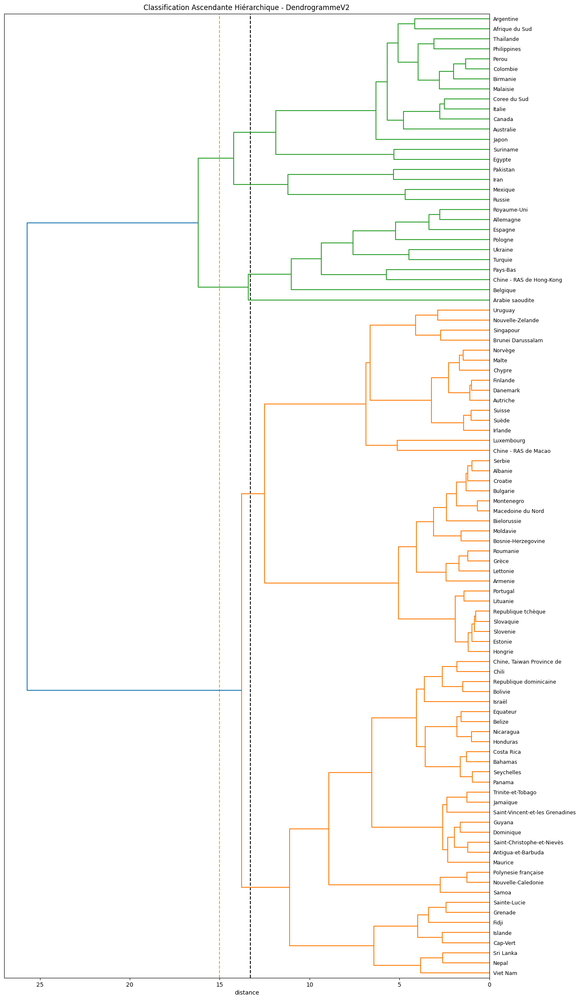

In [98]:
def clust_dendrogramV3(Z,names):  
    plt.figure(figsize=(15,30))    
    plt.axvline(x=13.3,color="black", linestyle="dashed")   
    plt.axvline(x=15, color ="orange", linestyle="dashed")
    plt.title("Classification Ascendante Hiérarchique - DendrogrammeV2")    
    plt.xlabel("distance")
    dendrogram(               
        Z,                    
        labels = names,       
        truncate_mode="lastp", 
        orientation = "left", 
        p=96,                
        leaf_font_size = 9    
    )
    plt.show()     
X = df_data3.values    
X[np.isinf(X)] = np.nan 
X = np.nan_to_num(X)    
names = df_data3.index 

std_scale = preprocessing.StandardScaler().fit(X)   
    
X_scaled = std_scale.transform(X)

Z = linkage(X_scaled, "ward", metric = "euclidean")          

clust_dendrogramV3(Z,names)

## 8.4 - Dendrogramme sur 6 lignes

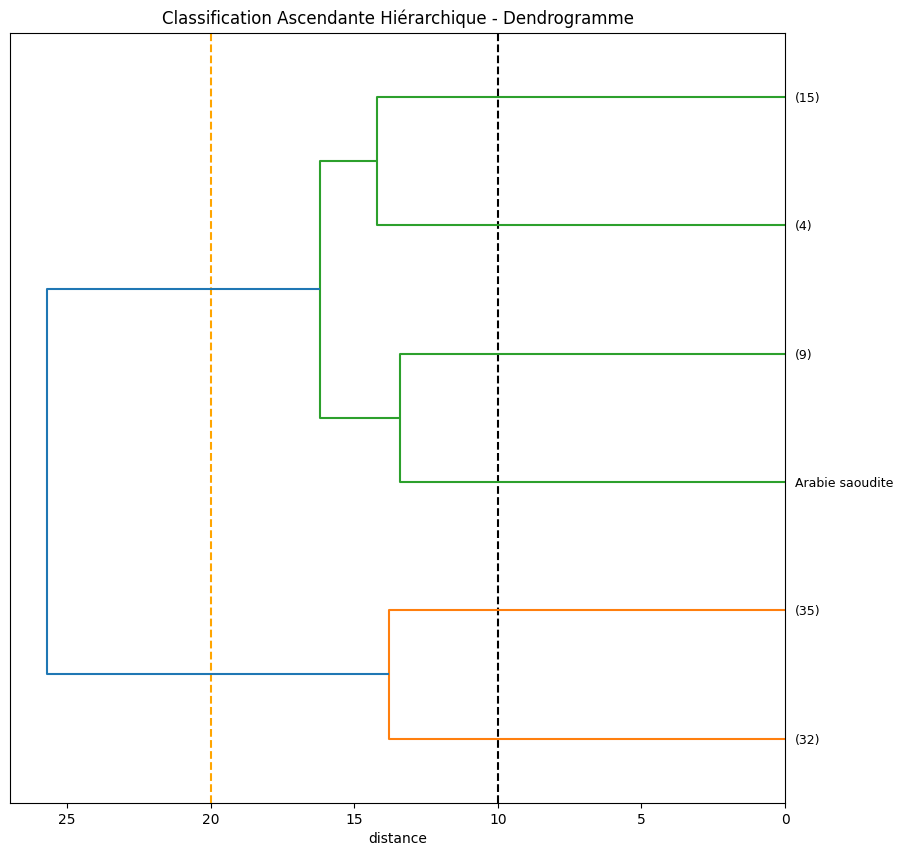

In [99]:
def clust_dendrogram7(Z,names):  
    plt.figure(figsize=(10,10))    
    plt.axvline(x=10,color="black", linestyle="dashed")  
    plt.axvline(x=20, color ="orange", linestyle="dashed")
    plt.title("Classification Ascendante Hiérarchique - Dendrogramme")    
    plt.xlabel("distance")
    dendrogram(               
        Z,                    
        labels = names,       
        truncate_mode="lastp",
        orientation = "left", 
        p=6,                
        leaf_font_size = 9    
    )
    plt.show()     
       
clust_dendrogram7(Z,names)

# 9 - Analyse en Composantes Principales (ACP)
## 9.1 - Eboulis des valeurs propres
### 9.1.1 - définition de l'affichage du tracé d'éboulis des valeurs propres

In [100]:
def display_scree_eigenvalues(pca):        
    scree = pca.explained_variance_ratio_*100   
    plt.bar(np.arange(len(scree))+1, scree)     
    plt.plot(np.arange(len(scree))+1, scree.cumsum(),c = "red", marker ="o")  
    plt.xlabel("rang axe d'inertie")    
    plt.ylabel("% inertie")
    plt.title("Eboulis des valeurs propres")
    plt.show(block = False)

In [101]:
n_comp = 17             
data_pca = df_data3     
data_pca = data_pca.fillna(0) 
X=data_pca.values              
names = df_data3.index         
features = data_pca.columns   
std_scale = preprocessing.StandardScaler().fit(X) 
X_scaled = std_scale.transform(X) 
pca = decomposition.PCA(n_components = n_comp)                                             
pca.fit(X_scaled) 

PCA(n_components=17)

In [102]:
poulet3 = pd.DataFrame(X_scaled,
                     index = df_data3.index,
                     columns = df_data3.columns)

In [103]:
pca.explained_variance_ratio_

array([2.94155274e-01, 1.37835353e-01, 1.01537742e-01, 7.86718810e-02,
       7.23210116e-02, 6.13194388e-02, 5.47296024e-02, 4.63285895e-02,
       4.11411776e-02, 3.14608837e-02, 2.91673369e-02, 2.06686727e-02,
       1.36908081e-02, 9.33859262e-03, 6.82664788e-03, 5.95192572e-04,
       2.11795620e-04])

In [104]:
pca.explained_variance_ratio_.cumsum()

array([0.29415527, 0.43199063, 0.53352837, 0.61220025, 0.68452126,
       0.7458407 , 0.8005703 , 0.84689889, 0.88804007, 0.91950095,
       0.94866829, 0.96933696, 0.98302777, 0.99236636, 0.99919301,
       0.9997882 , 1.        ])

### 9.1.2 - Traçage

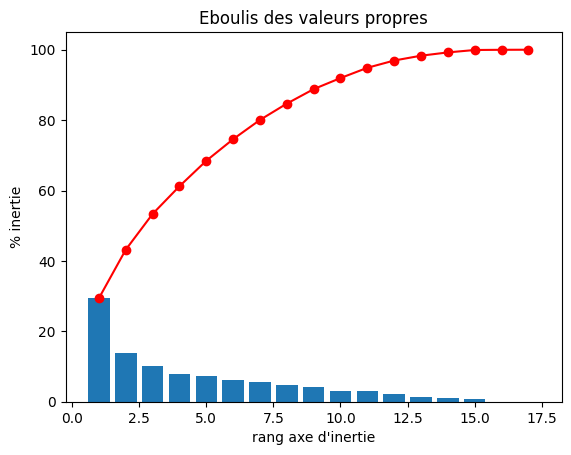

In [105]:
display_scree_eigenvalues(pca)

#### Je vais choisir 6 composantes principales, car ces premières dimensions représentent près de 75 % des informations importantes

In [106]:
# Clustering hiérarchique agglomératif du df "poulet3" pour découpage en 6 clusters
clusters = fcluster(Z,6, criterion = "maxclust") #  
classes6_3 = pd.DataFrame({"cluster": clusters,"pays":names})
print(classes6_3)

    cluster                pays
0         6      Afrique du Sud
1         2             Albanie
2         3           Allemagne
3         1  Antigua-et-Barbuda
4         4     Arabie saoudite
..      ...                 ...
91        1   Trinite-et-Tobago
92        3             Turquie
93        3             Ukraine
94        2             Uruguay
95        1            Viet Nam

[96 rows x 2 columns]


In [107]:
classes_clust3 = classes6_3.set_index("pays")
data_clust6_3 = pd.merge(poulet3, classes6_3, on=["pays"], how="outer")
result_clustering6_3 = data_clust6_3.drop("pays", axis=1).groupby("cluster").mean()
#result_clustering6 = data_clust.groupby("cluster").mean()
result_clustering6_3
# "result_clustering6" cotient les moyennes des variables standardisées pour chaque cluster

,population,%_evolution_2007/2017,cout_viande_pers/an(USD),PIB_habitant(USD),Tx_inflation,production,cout_production(USD/t),import_tonnes,export_tonnes,importFrance_tonnes,exportFrance_tonnes,emission_co2(tonnes),stabilite,distance_france(km),nourriture,disponibilite_interieure,dispo_alimentaire(kg/pers/an)
cluster,,,,,,,,,,,,,,,,,
1,-0.41,0.28,0.15,-0.58,-0.36,-0.49,0.17,-0.38,-0.36,-0.21,-0.20,-0.23,0.09,0.63,-0.46,-0.44,0.72
2,-0.49,-0.50,-0.21,0.53,-0.11,-0.53,0.00,-0.32,-0.25,-0.15,-0.17,-0.42,0.47,-0.61,-0.52,-0.51,-0.65
3,0.53,-0.28,-0.69,0.53,0.24,0.84,-0.37,1.18,2.50,0.73,1.81,0.10,-0.34,-0.84,0.65,0.49,-0.38
4,0.27,2.41,0.82,0.78,-0.69,0.00,-0.59,4.05,-0.16,8.87,-0.20,0.70,-1.18,-0.26,0.83,0.92,0.85
5,3.13,0.57,0.22,-0.56,0.54,2.81,-0.00,1.08,-0.15,-0.22,-0.20,3.84,-1.88,-0.09,2.90,3.06,-0.09
6,0.86,0.42,0.47,-0.21,0.80,1.04,-0.11,0.29,-0.08,-0.17,-0.19,0.34,-0.51,0.63,0.98,0.96,0.17


In [108]:
data_clust6_3.head()

,pays,population,%_evolution_2007/2017,cout_viande_pers/an(USD),PIB_habitant(USD),Tx_inflation,production,cout_production(USD/t),import_tonnes,export_tonnes,importFrance_tonnes,exportFrance_tonnes,emission_co2(tonnes),stabilite,distance_france(km),nourriture,disponibilite_interieure,dispo_alimentaire(kg/pers/an),cluster
0,Afrique du Sud,0.87,0.64,0.92,-0.68,0.63,1.39,0.87,2.49,-0.03,-0.22,-0.20,0.53,-0.73,0.61,1.84,1.96,0.77,6
1,Albanie,-0.56,-1.17,1.45,-0.73,0.12,-0.65,-0.59,-0.38,-0.38,-0.22,-0.20,-0.46,0.10,-0.93,-0.61,-0.58,-1.03,2
2,Allemagne,1.55,-0.62,-0.52,1.03,-0.08,0.58,0.46,2.46,1.42,1.57,1.93,0.25,0.36,-1.09,1.11,0.52,-1.01,3
3,Antigua-et-Barbuda,-0.63,0.40,-0.46,-0.42,-0.23,-0.67,-0.59,-0.46,-0.38,-0.22,-0.20,-0.48,0.56,0.18,-0.64,-0.62,2.04,1
4,Arabie saoudite,0.27,2.41,0.82,0.78,-0.69,0.00,-0.59,4.05,-0.16,8.87,-0.20,0.70,-1.18,-0.26,0.83,0.92,0.85,4


## 9.2 - Visualisation des 6 clusters depuis un clustermap

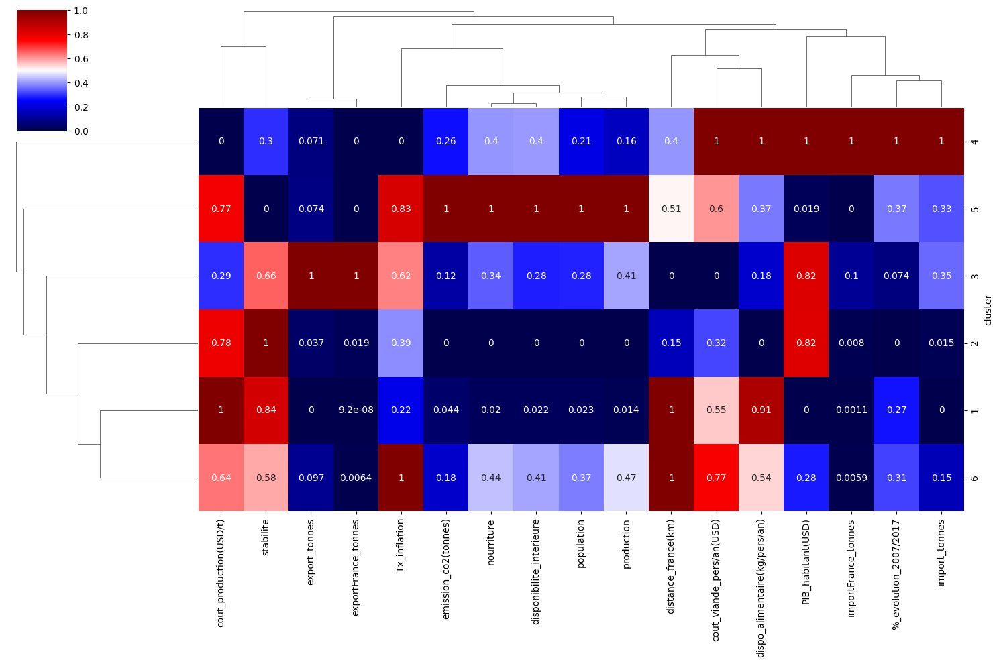

In [109]:
clustermap = sns.clustermap(result_clustering6_3, figsize = (15,10), annot = True, standard_scale =1, cmap="seismic")
annot_data = clustermap.data2d
df_annot = pd.DataFrame(annot_data)
plt.show()

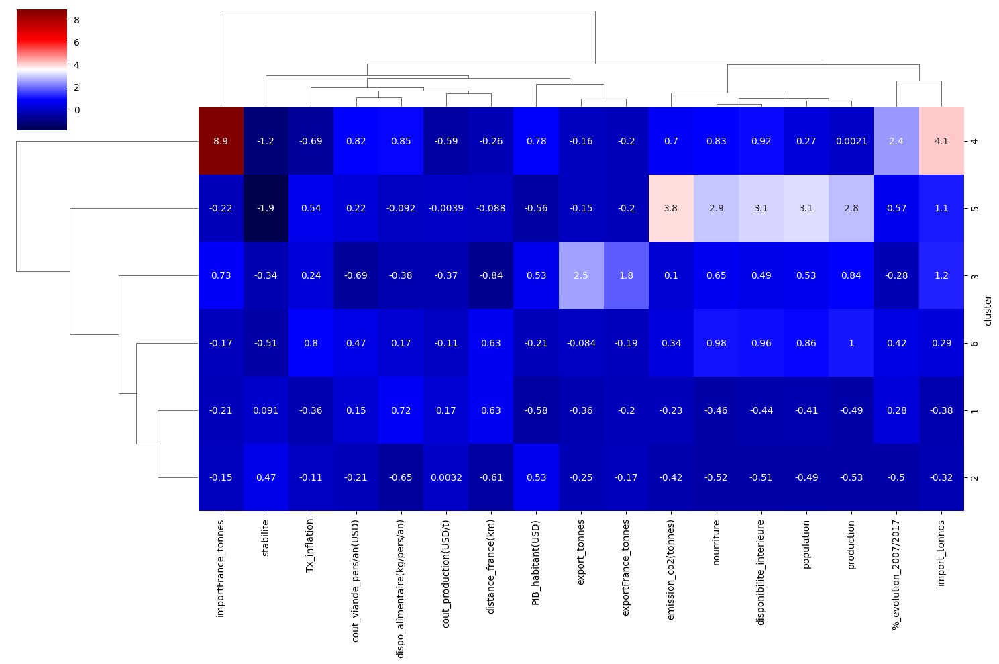

In [110]:
clustermap = sns.clustermap(result_clustering6_3, figsize = (15,10), annot = True, standard_scale =None, cmap="seismic")

In [111]:
print(df_annot)

         cout_production(USD/t)  stabilite  export_tonnes  \
cluster                                                     
4                          0.00       0.30           0.07   
5                          0.77       0.00           0.07   
3                          0.29       0.66           1.00   
2                          0.78       1.00           0.04   
1                          1.00       0.84           0.00   
6                          0.64       0.58           0.10   

         exportFrance_tonnes  Tx_inflation  emission_co2(tonnes)  nourriture  \
cluster                                                                        
4                       0.00          0.00                  0.26        0.40   
5                       0.00          0.83                  1.00        1.00   
3                       1.00          0.62                  0.12        0.34   
2                       0.02          0.39                  0.00        0.00   
1                       0.00   

### 9.2.1 - Détails des clusters
### 9.2.1.1 - Vérification du type "series" pour les valeurs des colonnes du df "result_clustering6_3"

In [112]:
for col in result_clustering6_3.columns:
    if isinstance(result_clustering6_3[col], pd.Series):
        print(f"{col} est de type Series")
    else:
        print(f"{col} n'est pas de type Series")

population est de type Series
%_evolution_2007/2017 est de type Series
cout_viande_pers/an(USD) est de type Series
PIB_habitant(USD) est de type Series
Tx_inflation est de type Series
production est de type Series
cout_production(USD/t) est de type Series
import_tonnes est de type Series
export_tonnes est de type Series
importFrance_tonnes est de type Series
exportFrance_tonnes est de type Series
emission_co2(tonnes) est de type Series
stabilite est de type Series
distance_france(km) est de type Series
nourriture est de type Series
disponibilite_interieure est de type Series
dispo_alimentaire(kg/pers/an) est de type Series


#### 9.2.1.2 - Visualisation de la répartition des valeurs dans les clusters

In [113]:
columns_to_process = result_clustering6_3.columns

In [114]:
def map_to_categories(value):
     
    if value >= 0.7:
        return "Forte"
    elif value > 0.3 and value < 0.7: 
        return "Moyenne"
    else :
        return "Faible"
    
columns_by_cluster = {}
# Application de la fonction map_to_categories à chaque colonne de "result_clustering6"
for col in df_annot.columns:  # ignore les colonnes pays et cluster
    if col in columns_to_process and isinstance(df_annot[col], pd.Series):
        df_annot[col + "_cat"] = df_annot[col].apply(map_to_categories)
    
grouped_data = df_annot.groupby("cluster") # Regroupement des données par cluster

for cluster, group in grouped_data:
    columns_by_cluster[cluster] = {}
    
    for category in ['Forte', 'Moyenne', 'Faible']:
        columns_with_category = [col.replace("_cat", "") for col in group.columns if group[col].iloc[0] == category]
        columns_by_cluster[cluster][category] = columns_with_category

for cluster, columns_dict in columns_by_cluster.items():
        print("\n","cluster {}:".format(cluster))
        for category, columns_list in columns_dict.items():
            print(" valeurs {} : {}".format(category, ", ".join(columns_list)))


 cluster 1:
 valeurs Forte : cout_production(USD/t), stabilite, distance_france(km), dispo_alimentaire(kg/pers/an)
 valeurs Moyenne : cout_viande_pers/an(USD)
 valeurs Faible : export_tonnes, exportFrance_tonnes, Tx_inflation, emission_co2(tonnes), nourriture, disponibilite_interieure, population, production, PIB_habitant(USD), importFrance_tonnes, %_evolution_2007/2017, import_tonnes

 cluster 2:
 valeurs Forte : cout_production(USD/t), stabilite, PIB_habitant(USD)
 valeurs Moyenne : Tx_inflation, cout_viande_pers/an(USD)
 valeurs Faible : export_tonnes, exportFrance_tonnes, emission_co2(tonnes), nourriture, disponibilite_interieure, population, production, distance_france(km), dispo_alimentaire(kg/pers/an), importFrance_tonnes, %_evolution_2007/2017, import_tonnes

 cluster 3:
 valeurs Forte : export_tonnes, exportFrance_tonnes, PIB_habitant(USD)
 valeurs Moyenne : stabilite, Tx_inflation, nourriture, production, import_tonnes
 valeurs Faible : cout_production(USD/t), emission_co2(t

In [115]:
columns_clusters = {column: {"Forte": [], "Moyenne": [], "Faible": []} for column in columns_to_process}

for cluster, columns_dict in columns_by_cluster.items():
    for category, column_list in columns_dict.items():
        for column in column_list:
            columns_clusters[column][category].append(cluster)

def format_columns_clusters_markdown_table(cluster_data):
    markdown = "| Colonnes | Valeurs Fortes (Clusters) | Valeurs Moyennes (Clusters) | Valeurs Faibles (Clusters) |\n"
    markdown += "|:--------:|:------------------------:|:-------------------------:|:-----------------------:|\n"
    for column, clusters_dict in cluster_data.items():
        forte_clusters = ', '.join(str(cluster) for cluster in clusters_dict['Forte'])
        moyenne_clusters = ', '.join(str(cluster) for cluster in clusters_dict['Moyenne'])
        faible_clusters = ', '.join(str(cluster) for cluster in clusters_dict['Faible'])
        markdown += "| {} | {} | {} | {} |\n".format(column, forte_clusters, moyenne_clusters, faible_clusters)
        markdown += "\n"  # Add a newline between each column's rows
    return markdown

print(format_columns_clusters_markdown_table(columns_clusters))

| Colonnes | Valeurs Fortes (Clusters) | Valeurs Moyennes (Clusters) | Valeurs Faibles (Clusters) |
|:--------:|:------------------------:|:-------------------------:|:-----------------------:|
| population | 5 | 6 | 1, 2, 3, 4 |

| %_evolution_2007/2017 | 4 | 5, 6 | 1, 2, 3 |

| cout_viande_pers/an(USD) | 4, 6 | 1, 2, 5 | 3 |

| PIB_habitant(USD) | 2, 3, 4 |  | 1, 5, 6 |

| Tx_inflation | 5, 6 | 2, 3 | 1, 4 |

| production | 5 | 3, 6 | 1, 2, 4 |

| cout_production(USD/t) | 1, 2, 5 | 6 | 3, 4 |

| import_tonnes | 4 | 3, 5 | 1, 2, 6 |

| export_tonnes | 3 |  | 1, 2, 4, 5, 6 |

| importFrance_tonnes | 4 |  | 1, 2, 3, 5, 6 |

| exportFrance_tonnes | 3 |  | 1, 2, 4, 5, 6 |

| emission_co2(tonnes) | 5 |  | 1, 2, 3, 4, 6 |

| stabilite | 1, 2 | 3, 6 | 4, 5 |

| distance_france(km) | 1, 6 | 4, 5 | 2, 3 |

| nourriture | 5 | 3, 4, 6 | 1, 2 |

| disponibilite_interieure | 5 | 4, 6 | 1, 2, 3 |

| dispo_alimentaire(kg/pers/an) | 1, 4 | 5, 6 | 2, 3 |




In [116]:
colonnes_interet = ['population', '%_evolution_2007/2017', 'cout_viande_pers/an(USD)', 'PIB_habitant(USD)', 
                    'Tx_inflation', 'production', 'cout_production(USD/t)', 'import_tonnes', 'export_tonnes', 
                    'importFrance_tonnes', 'exportFrance_tonnes', 'emission_co2(tonnes)', 'stabilite', 'distance_france(km)', 
                    'nourriture', 'disponibilite_interieure', 'dispo_alimentaire(kg/pers/an)']

for colonne in colonnes_interet:
    colonne_triee = df_annot.sort_values(colonne, ascending=False)
    
    meilleurs_clusters = colonne_triee.index[:3]
    
    labels_clusters = [f"Cluster {i}" for i in meilleurs_clusters]
    
    print(f"L'indicateur \"{colonne}\" est le mieux représenté dans les clusters : {', '.join(labels_clusters)}")

L'indicateur "population" est le mieux représenté dans les clusters : Cluster 5, Cluster 6, Cluster 3
L'indicateur "%_evolution_2007/2017" est le mieux représenté dans les clusters : Cluster 4, Cluster 5, Cluster 6
L'indicateur "cout_viande_pers/an(USD)" est le mieux représenté dans les clusters : Cluster 4, Cluster 6, Cluster 5
L'indicateur "PIB_habitant(USD)" est le mieux représenté dans les clusters : Cluster 4, Cluster 3, Cluster 2
L'indicateur "Tx_inflation" est le mieux représenté dans les clusters : Cluster 6, Cluster 5, Cluster 3
L'indicateur "production" est le mieux représenté dans les clusters : Cluster 5, Cluster 6, Cluster 3
L'indicateur "cout_production(USD/t)" est le mieux représenté dans les clusters : Cluster 1, Cluster 2, Cluster 5
L'indicateur "import_tonnes" est le mieux représenté dans les clusters : Cluster 4, Cluster 3, Cluster 5
L'indicateur "export_tonnes" est le mieux représenté dans les clusters : Cluster 3, Cluster 6, Cluster 5
L'indicateur "importFrance_ton

In [117]:
df_annot

,cout_production(USD/t),stabilite,export_tonnes,exportFrance_tonnes,Tx_inflation,emission_co2(tonnes),nourriture,disponibilite_interieure,population,production,...,disponibilite_interieure_cat,population_cat,production_cat,distance_france(km)_cat,cout_viande_pers/an(USD)_cat,dispo_alimentaire(kg/pers/an)_cat,PIB_habitant(USD)_cat,importFrance_tonnes_cat,%_evolution_2007/2017_cat,import_tonnes_cat
cluster,,,,,,,,,,,,,,,,,,,,,
4,0.00,0.30,0.07,0.00,0.00,0.26,0.40,0.40,0.21,0.16,...,Moyenne,Faible,Faible,Moyenne,Forte,Forte,Forte,Forte,Forte,Forte
5,0.77,0.00,0.07,0.00,0.83,1.00,1.00,1.00,1.00,1.00,...,Forte,Forte,Forte,Moyenne,Moyenne,Moyenne,Faible,Faible,Moyenne,Moyenne
3,0.29,0.66,1.00,1.00,0.62,0.12,0.34,0.28,0.28,0.41,...,Faible,Faible,Moyenne,Faible,Faible,Faible,Forte,Faible,Faible,Moyenne
2,0.78,1.00,0.04,0.02,0.39,0.00,0.00,0.00,0.00,0.00,...,Faible,Faible,Faible,Faible,Moyenne,Faible,Forte,Faible,Faible,Faible
1,1.00,0.84,0.00,0.00,0.22,0.04,0.02,0.02,0.02,0.01,...,Faible,Faible,Faible,Forte,Moyenne,Forte,Faible,Faible,Faible,Faible
6,0.64,0.58,0.10,0.01,1.00,0.18,0.44,0.41,0.37,0.47,...,Moyenne,Moyenne,Moyenne,Forte,Forte,Moyenne,Faible,Faible,Moyenne,Faible


In [118]:
meilleures_colonnes = ['population', '%_evolution_2007/2017', 'PIB_habitant(USD)', 'stabilite', 'cout_production(USD/t)',
                       'import_tonnes', 'nourriture']
moins_bonnes_colonnes = ['cout_viande_pers/an(USD)', 'Tx_inflation', 'production', 'distance_france(km)', 
                         'disponibilite_interieure', 'dispo_alimentaire(kg/pers/an)']

df_annot['moyenne_meilleures'] = df_annot[meilleures_colonnes].mean(axis=1)

df_annot['moyenne_moins_bonnes'] = df_annot[moins_bonnes_colonnes].mean(axis=1)

indices_meilleures = df_annot['moyenne_meilleures'].nlargest(3).index.tolist()
indices_moins_bonnes = df_annot['moyenne_meilleures'].nsmallest(3).index.tolist()

indices_meilleures_moins_bonnes = df_annot['moyenne_moins_bonnes'].nlargest(3).index.tolist()
indices_moins_bonnes_moins_bonnes = df_annot['moyenne_moins_bonnes'].nsmallest(3).index.tolist()

meilleurs_clusters = [str(cluster) for cluster in indices_meilleures]
moins_bons_clusters = [str(cluster) for cluster in indices_moins_bonnes]
meilleurs_clusters_moins_bons = [str(cluster) for cluster in indices_meilleures_moins_bonnes]
moins_bons_clusters_moins_bons = [str(cluster) for cluster in indices_moins_bonnes_moins_bonnes]

phrase_finale = f"Les 3 clusters ayant les meilleures moyennes sur les colonnes \"{', '.join(meilleures_colonnes)}\" sont les clusters \"{', '.join(meilleurs_clusters)}\".\n" \
               f"Les 3 clusters ayant les meilleures moyennes sur les colonnes \"{', '.join(moins_bonnes_colonnes)}\" sont les clusters \"{', '.join(meilleurs_clusters_moins_bons)}\"."

print(phrase_finale)


Les 3 clusters ayant les meilleures moyennes sur les colonnes "population, %_evolution_2007/2017, PIB_habitant(USD), stabilite, cout_production(USD/t), import_tonnes, nourriture" sont les clusters "4, 5, 3".
Les 3 clusters ayant les meilleures moyennes sur les colonnes "cout_viande_pers/an(USD), Tx_inflation, production, distance_france(km), disponibilite_interieure, dispo_alimentaire(kg/pers/an)" sont les clusters "5, 6, 4".


### 9.2.2 - Listing des pays par cluster

In [119]:
df_par_cluster6_3 = {}
for cluster in classes6_3["cluster"].unique():
    cluster_df6_3 = classes6_3[classes6_3["cluster"] == cluster].copy()
    nom_df6_3 = f"cluster{cluster}"
    df_par_cluster6_3[nom_df6_3] = cluster_df6_3
    
for nom_df6_3, df_clust6_3 in df_par_cluster6_3.items():
    print(f"cluster {nom_df6_3}:")
    print(df_clust6_3)
    print()

cluster cluster6:
    cluster            pays
0         6  Afrique du Sud
5         6       Argentine
7         6       Australie
18        6          Canada
24        6        Colombie
29        6          Egypte
45        6          Italie
47        6           Japon
52        6        Malaisie
57        6        Birmanie
66        6           Perou
67        6     Philippines
71        6    Coree du Sud
88        6        Suriname
90        6       Thaïlande

cluster cluster2:
    cluster                  pays
1         2               Albanie
6         2               Armenie
8         2              Autriche
10        2           Bielorussie
14        2    Bosnie-Herzegovine
15        2     Brunei Darussalam
16        2              Bulgarie
21        2  Chine - RAS de Macao
23        2                Chypre
26        2               Croatie
27        2              Danemark
32        2               Estonie
35        2              Finlande
36        2                 Grèce
40   

## Cluster 1 ( 32 pays)

In [120]:
print(df_par_cluster6_3["cluster1"], 'nb_pays:', len(df_par_cluster6_3["cluster1"]), df_par_cluster6_3["cluster1"]["pays"].tolist())

    cluster                             pays
3         1               Antigua-et-Barbuda
9         1                          Bahamas
12        1                           Belize
13        1                          Bolivie
17        1                         Cap-Vert
19        1                            Chili
22        1        Chine, Taiwan Province de
25        1                       Costa Rica
28        1                        Dominique
30        1                         Equateur
34        1                            Fidji
37        1                          Grenade
38        1                           Guyana
39        1                         Honduras
43        1                          Islande
44        1                           Israël
46        1                         Jamaïque
54        1                          Maurice
58        1                            Nepal
59        1                        Nicaragua
61        1               Nouvelle-Caledonie
64        

## Cluster 2 ( 35 pays)

In [121]:
print(df_par_cluster6_3["cluster2"], 'nb_pays:', len(df_par_cluster6_3["cluster2"]), df_par_cluster6_3["cluster2"]["pays"].tolist())

    cluster                  pays
1         2               Albanie
6         2               Armenie
8         2              Autriche
10        2           Bielorussie
14        2    Bosnie-Herzegovine
15        2     Brunei Darussalam
16        2              Bulgarie
21        2  Chine - RAS de Macao
23        2                Chypre
26        2               Croatie
27        2              Danemark
32        2               Estonie
35        2              Finlande
36        2                 Grèce
40        2               Hongrie
42        2               Irlande
48        2              Lettonie
49        2              Lituanie
50        2            Luxembourg
51        2     Macedoine du Nord
53        2                 Malte
56        2            Montenegro
60        2               Norvège
62        2      Nouvelle-Zelande
70        2              Portugal
72        2              Moldavie
74        2              Roumanie
80        2                Serbie
82        2   

## Cluster 3 ( 9 pays)

In [122]:
print(df_par_cluster6_3["cluster3"], 'nb_pays:', len(df_par_cluster6_3["cluster3"]), df_par_cluster6_3["cluster3"]["pays"].tolist())

    cluster                      pays
2         3                 Allemagne
11        3                  Belgique
20        3  Chine - RAS de Hong-Kong
31        3                   Espagne
65        3                  Pays-Bas
68        3                   Pologne
75        3               Royaume-Uni
92        3                   Turquie
93        3                   Ukraine nb_pays: 9 ['Allemagne', 'Belgique', 'Chine - RAS de Hong-Kong', 'Espagne', 'Pays-Bas', 'Pologne', 'Royaume-Uni', 'Turquie', 'Ukraine']


## Cluster 4 ( 1 pays)

In [123]:
print(df_par_cluster6_3["cluster4"], 'nb_pays:', len(df_par_cluster6_3["cluster4"]), df_par_cluster6_3["cluster4"]["pays"].tolist())

   cluster             pays
4        4  Arabie saoudite nb_pays: 1 ['Arabie saoudite']


## Cluster 5 ( 4 pays)

In [124]:
print(df_par_cluster6_3["cluster5"], 'nb_pays:', len(df_par_cluster6_3["cluster5"]), df_par_cluster6_3["cluster5"]["pays"].tolist())

    cluster      pays
33        5    Russie
41        5      Iran
55        5   Mexique
63        5  Pakistan nb_pays: 4 ['Russie', 'Iran', 'Mexique', 'Pakistan']


## Cluster 6 ( 15 pays)

In [125]:
print(df_par_cluster6_3["cluster6"], 'nb_pays:', len(df_par_cluster6_3["cluster6"]), df_par_cluster6_3["cluster6"]["pays"].tolist())

    cluster            pays
0         6  Afrique du Sud
5         6       Argentine
7         6       Australie
18        6          Canada
24        6        Colombie
29        6          Egypte
45        6          Italie
47        6           Japon
52        6        Malaisie
57        6        Birmanie
66        6           Perou
67        6     Philippines
71        6    Coree du Sud
88        6        Suriname
90        6       Thaïlande nb_pays: 15 ['Afrique du Sud', 'Argentine', 'Australie', 'Canada', 'Colombie', 'Egypte', 'Italie', 'Japon', 'Malaisie', 'Birmanie', 'Perou', 'Philippines', 'Coree du Sud', 'Suriname', 'Thaïlande']


## 9.3 - Affichage des cercles des corrélations et plans factoriels
### 9.3.1 - Composantes F1 et F2

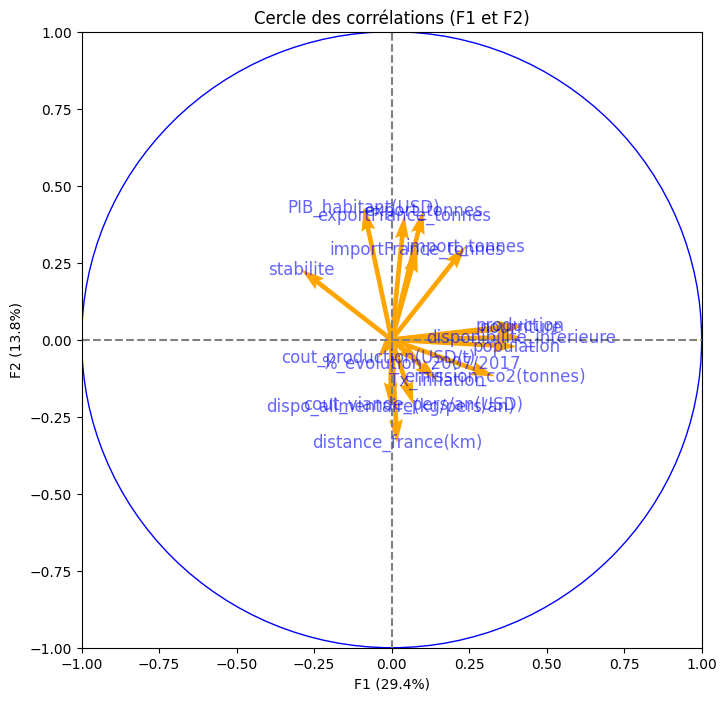

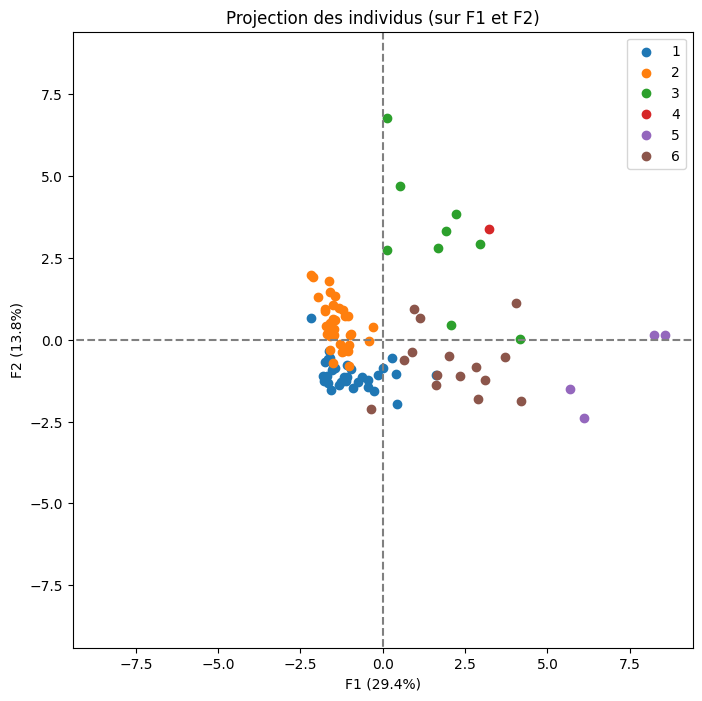

In [126]:
features = poulet3.columns
pcs = pca.components_
display_circles(pcs, n_comp, pca, [(0,1)], labels = np.array(features))

X_projected = pca.transform(poulet3)
display_factorial_planes(X_projected, n_comp, pca, [(0,1)], labels =None, alpha=1, illustrative_var=clusters)

plt.show()

### 9.3.2 - Composantes F3 et F4

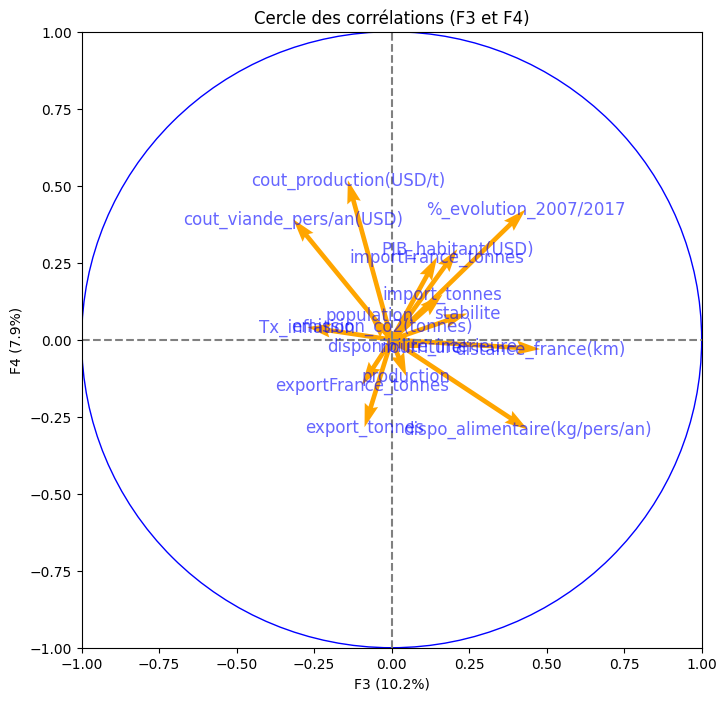

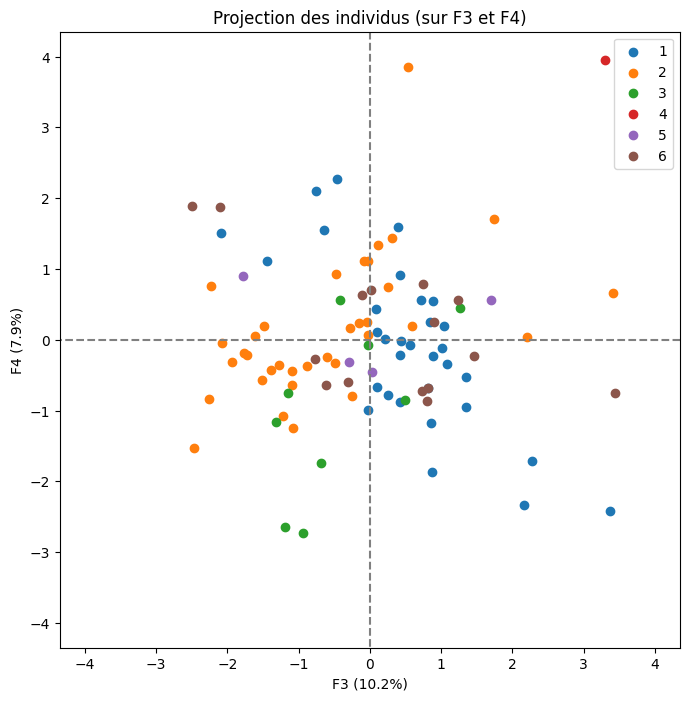

In [127]:
features = poulet3.columns
pcs = pca.components_
display_circles(pcs, n_comp, pca, [(2,3)], labels = np.array(features))

X_projected = pca.transform(poulet3)
display_factorial_planes(X_projected, n_comp, pca, [(2,3)], labels =None, alpha=1, illustrative_var=clusters)

plt.show()

### 9.3.3 - Composantes F5 et F6

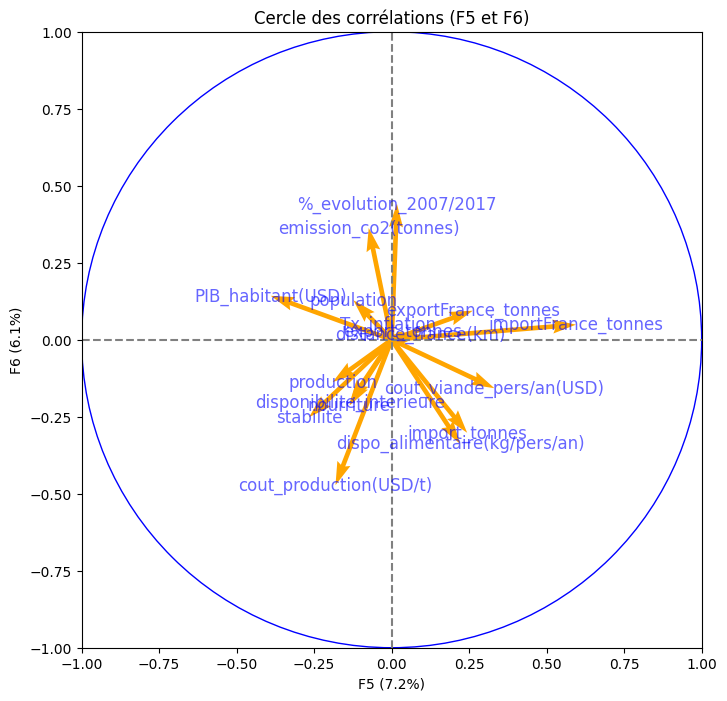

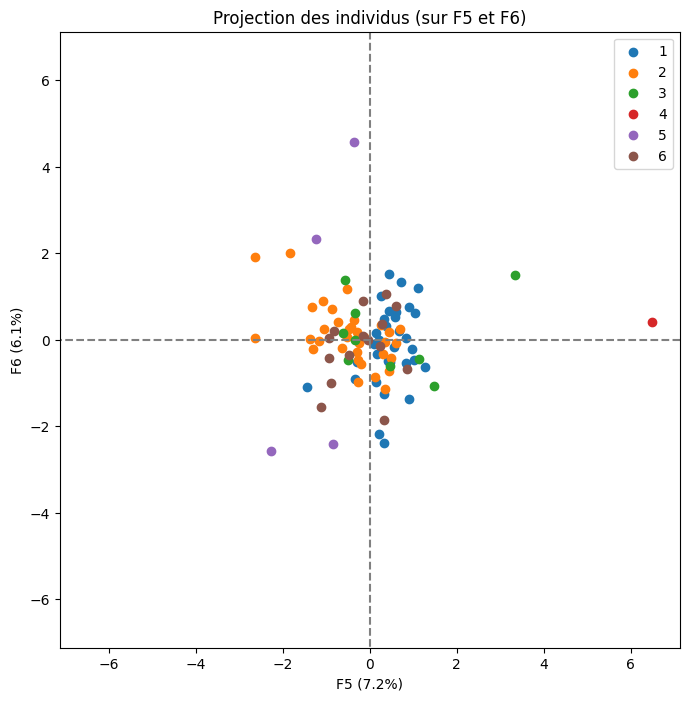

In [128]:
features = poulet3.columns
pcs = pca.components_
display_circles(pcs, n_comp, pca, [(4,5)], labels = np.array(features))

X_projected = pca.transform(poulet3)
display_factorial_planes(X_projected, n_comp, pca, [(4,5)], labels =None, alpha=1, illustrative_var=clusters)

plt.show()

## 9.4 - Diagrammes de Kiviat

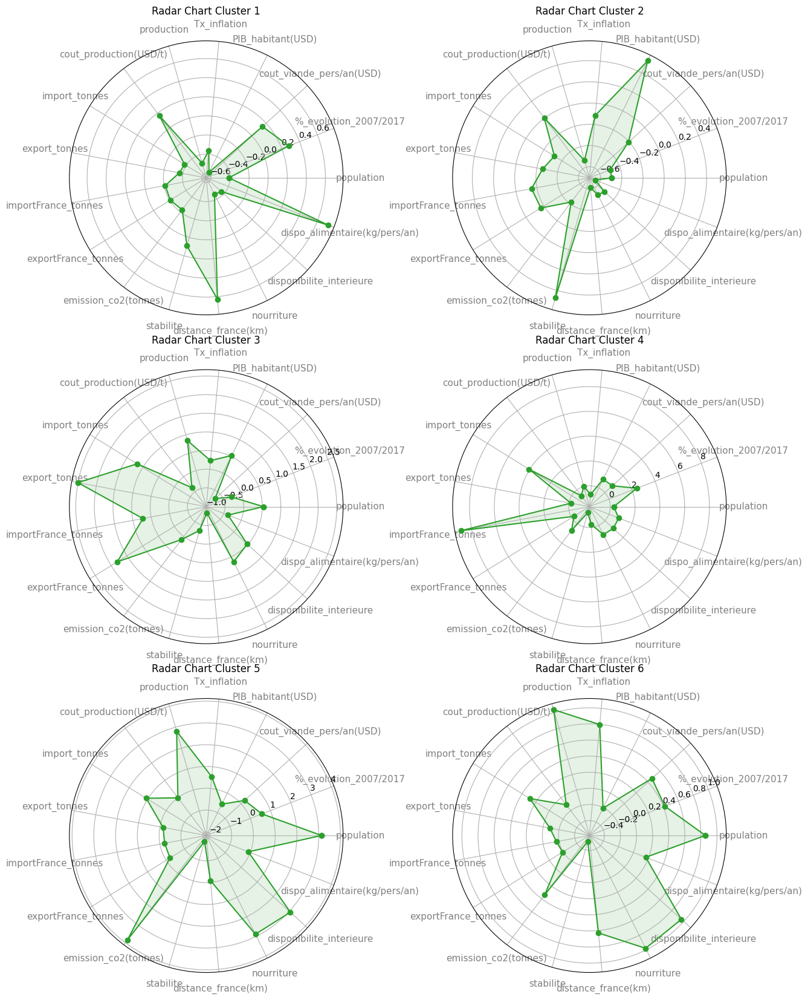

In [129]:
kiviats3 = []
for i in range(6):
    kiviat_df3 = pd.DataFrame({
        "Col A": ['population', '%_evolution_2007/2017', 'cout_viande_pers/an(USD)', 'PIB_habitant(USD)', 'Tx_inflation', 'production',
                  'cout_production(USD/t)', 'import_tonnes', 'export_tonnes', 'importFrance_tonnes', 'exportFrance_tonnes',
                  'emission_co2(tonnes)', 'stabilite', 'distance_france(km)', 'nourriture', 'disponibilite_interieure',
                  'dispo_alimentaire(kg/pers/an)'],
        "Col B": result_clustering6_3.iloc[i].values
    })
    kiviats3.append(kiviat_df3)

# Création de la figure
fig = plt.figure(figsize=(15, 20))
fig.tight_layout()

# Boucle pour les sous-graphiques
for i in range(6):
    ax = fig.add_subplot(3, 2, i+1, projection="polar")
    theta = np.arange(len(kiviats3[i])+1) / float(len(kiviats3[i])) * 2 * np.pi
    values = kiviats3[i]["Col B"].values
    values = np.append(values, values[0])
    l1, = ax.plot(theta, values, color="C2", marker="o", label="Nom Col B")
    plt.xticks(theta[:-1], kiviats3[i]["Col A"], color="grey", size=11)
    ax.tick_params(pad=10)
    ax.fill(theta, values, "green", alpha=0.1)
    plt.title(f"Radar Chart Cluster {i+1}")

plt.show()

### Je conserve les clusters 3 et 4

# 10 - K-Means

In [130]:
df_imputed3 = df_data3.copy() 

for column in df_imputed3.columns[df_imputed3.isnull().any()]:
    X = df_imputed3.drop(column, axis=1) 
    y = df_imputed3[column]  
    
    X_train = X[y.notnull()]  
    y_train = y[y.notnull()]  
    X_test = X[y.isnull()] 
    
    model = LinearRegression()
    model.fit(X_train, y_train)
    
    y_pred = model.predict(X_test)
    
    df_imputed3.loc[y.isnull(), column] = y_pred

df_imputed3.head()

,population,%_evolution_2007/2017,cout_viande_pers/an(USD),PIB_habitant(USD),Tx_inflation,production,cout_production(USD/t),import_tonnes,export_tonnes,importFrance_tonnes,exportFrance_tonnes,emission_co2(tonnes),stabilite,distance_france(km),nourriture,disponibilite_interieure,dispo_alimentaire(kg/pers/an)
pays,,,,,,,,,,,,,,,,,
Afrique du Sud,56641209,13.29,386.54,13860.30,6.90,1658159.00,2016.60,480345.55,58258.84,0.08,0.00,571841.10,-0.28,8654,2110000,2070000.00,36.14
Albanie,2879355,-3.25,439.46,12771.00,3.92,12912.00,0.00,17515.47,0.00,0.00,0.00,10486.40,0.38,1605,33000,30192.00,10.58
Allemagne,82624374,1.77,243.09,53071.50,2.76,1009565.00,1459.50,474950.63,300560.64,19245.40,32492.09,415700.30,0.59,882,1492000,913829.00,10.95
Antigua-et-Barbuda,91119,11.10,248.93,19840.30,1.87,96.00,0.00,6143.69,7.92,0.00,0.00,400.50,0.75,6708,5000,5171.00,54.02
Arabie saoudite,34193122,29.52,376.32,47306.20,-0.82,540258.00,0.00,730959.60,37415.41,97485.32,0.00,670946.20,-0.64,4694,1259000,1233802.00,37.23


In [131]:
imputer3 = SimpleImputer(strategy="mean")
column_to_impute = "stabilite"

df_imputed3 = df_data3.copy()

X = df_imputed3.drop(column_to_impute, axis=1)
y = df_imputed3[column_to_impute]

X_imputed3 = imputer.fit_transform(X)

df_imputed3[X.columns] = X_imputed3
scaler = StandardScaler()
X_scaled3 = scaler.fit_transform(df_imputed3)

pca = PCA(n_components = 2)
X_reduced3 = pca.fit_transform(X_imputed3)

df_X_reduced3 = pd.DataFrame(X_reduced3,index = df_imputed3.index)

In [132]:
df_X_reduced3.head()

,0,1
pays,,
Afrique du Sud,32774613.00,-1511504.99
Albanie,-21065950.37,248420.51
Allemagne,58701699.10,620568.94
Antigua-et-Barbuda,-23854035.78,205737.51
Arabie saoudite,10291563.28,-567931.49


In [133]:
def cluster(n_clusters):
    kmeans3 = KMeans(n_clusters=n_clusters, n_init=10)
    kmeans3.fit(X_reduced3)
    Z = kmeans3.predict(X_reduced3)
    return kmeans3, Z

#max_clusters = len(df_X_reduced)
max_clusters = 20
inerties = np.zeros(max_clusters)

for i in range(1, max_clusters):
    kmeans3, Z = cluster(i)
    inerties[i] = kmeans3.inertia_

data_kmeans3 = pgo.Scatter(
    x=np.arange(1, max_clusters),
    y=inerties[1:]
)

layout3 = pgo.Layout(
    title="k-means3 clustering",
    xaxis=pgo.layout.XAxis(title="Nb clusters", range=[0, max_clusters]),
    yaxis=pgo.layout.YAxis(title="Inertie")
)

fig3 = pgo.Figure(data=data_kmeans3, layout=layout3)
iplot(fig3, filename="clustering-inerties")

## 10.1 - Visualisation par quantité de clusters

Inertia 2 : 1275.09
Nombre d'itérations 2: 7.00
Inertia 3 : 1153.47
Nombre d'itérations 3: 6.00
Inertia 4 : 1001.09
Nombre d'itérations 4: 9.00
Inertia 5 : 929.88
Nombre d'itérations 5: 6.00


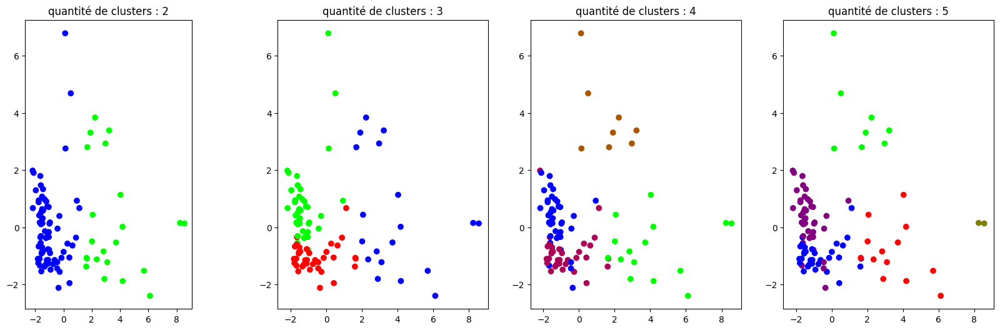

In [134]:
fig = plt.figure(figsize=(20, 6))
# X_scaled3 = X_scaled3[~np.isnan(X_scaled3).any(axis=1)]
imputer = SimpleImputer(strategy='mean')
X_scaled3 = imputer.fit_transform(X_scaled3)

cluster_params = [(2, 151), (3, 142), (4, 143), (5, 144)]

for n_clusters, subplot_num in cluster_params:
    km = KMeans(n_clusters=n_clusters)
    start = time.time()
    km.fit(X_scaled3)
    ax = fig.add_subplot(subplot_num)
    ax.scatter(X_projected[:, 0][:96], X_projected[:, 1][:96], c=km.labels_[:96], cmap="brg")
    ax.set_title("quantité de clusters : {}".format(n_clusters))
    end = time.time()
    # print(f"Time: {end - start}")
    # print(km.cluster_centers_)
    # print(km.labels_)
    print("Inertia {} : {:.2f}".format(n_clusters, km.inertia_))
    print("Nombre d'itérations {}: {:.2f}".format(n_clusters, km.n_iter_))


### Au regard des graphiques, on peut remarquer  que 3 clusters suffiront (ils restent bien distincts l'un de l'autre, peu de chevauchement parmis les individus, d'un cluster à l'autre)

## 10.2 - Clustering par K-means

In [135]:
kmeans = KMeans( n_clusters = 3 , n_init = 10, random_state=42)

In [136]:
kmeans.fit(X_scaled3)

KMeans(n_clusters=3, n_init=10, random_state=42)

### 10.2.1 - Récupération des clusters pour chaque individu et ajout des clusters au dataframe 

In [137]:
clusters = kmeans.labels_

In [138]:
X_scaled_clustered = pd.DataFrame(X_scaled3, columns=df_data3.columns, index= df_data3.index)
X_scaled_clustered["cluster"] = clusters

X_scaled_clustered.head()

,population,%_evolution_2007/2017,cout_viande_pers/an(USD),PIB_habitant(USD),Tx_inflation,production,cout_production(USD/t),import_tonnes,export_tonnes,importFrance_tonnes,exportFrance_tonnes,emission_co2(tonnes),stabilite,distance_france(km),nourriture,disponibilite_interieure,dispo_alimentaire(kg/pers/an),cluster
pays,,,,,,,,,,,,,,,,,,
Afrique du Sud,0.87,0.64,0.92,-0.68,0.63,1.39,0.87,2.49,-0.03,-0.22,-0.20,0.53,-0.74,0.61,1.84,1.96,0.77,2
Albanie,-0.56,-1.17,1.45,-0.73,0.12,-0.65,-0.59,-0.38,-0.38,-0.22,-0.20,-0.46,0.07,-0.93,-0.61,-0.58,-1.03,0
Allemagne,1.55,-0.62,-0.52,1.03,-0.08,0.58,0.46,2.46,1.42,1.57,1.93,0.25,0.33,-1.09,1.11,0.52,-1.01,1
Antigua-et-Barbuda,-0.63,0.40,-0.46,-0.42,-0.23,-0.67,-0.59,-0.46,-0.38,-0.22,-0.20,-0.48,0.52,0.18,-0.64,-0.62,2.04,0
Arabie saoudite,0.27,2.41,0.82,0.78,-0.69,0.00,-0.59,4.05,-0.16,8.87,-0.20,0.70,-1.18,-0.26,0.83,0.92,0.85,1


## 10.3 - Visualisation des clusters
### 10.3.1 - Création d'une PCA réduisant les données à 3 dimensions pour visualisation

In [139]:
pca = PCA(n_components = 3)
pca.fit(X_scaled3)

PCA(n_components=3)

### 10.3.2 - Mise à l'échelle

In [140]:
X_reduced2 = pca.transform(X_scaled3)

### 10.3.3 - Visualisation

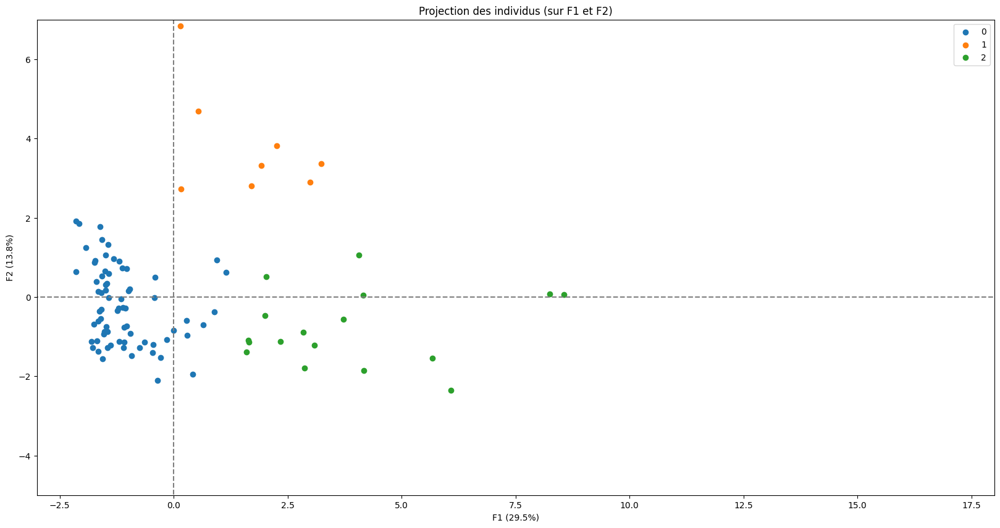

In [141]:
def display_factorial_planes2(X_projected, n_comp, pca, axis_ranks, labels=None, alpha=1, illustrative_var=None):
    for d1,d2 in axis_ranks:
        if d2 < n_comp:
 
            # initialisation de la figure       
            fig = plt.figure(figsize=(20,10))
        
            scatter = None
            
            # affichage des points
            if illustrative_var is None:
                scatter = plt.scatter(X_projected[:, d1], X_projected[:, d2], alpha=alpha)
            else:
                illustrative_var = np.array(illustrative_var)
                for value in np.unique(illustrative_var):
                    selected = np.where(illustrative_var == value)
                    plt.scatter(X_projected[selected, d1], X_projected[selected, d2], alpha=alpha, label=value)
                    plt.legend()

            # affichage des labels des points
            if labels is not None:
                for i,(x,y) in enumerate(X_projected[:,[d1,d2]]):
                    plt.text(x, y, labels[i],
                              fontsize='14', ha='center',va='center') 
                
            # détermination des limites du graphique
            boundary = np.max(np.abs(X_projected[:, [d1,d2]])) * 1.1
            plt.xlim([-boundary,boundary])
            plt.ylim([-boundary,boundary])
        
            # affichage des lignes horizontales et verticales
            plt.plot([-100, 100], [0, 0], color='grey', ls='--')
            plt.plot([0, 0], [-100, 100], color='grey', ls='--')

            # nom des axes, avec le pourcentage d'inertie expliqué
            plt.xlabel('F{} ({}%)'.format(d1+1, round(100*pca.explained_variance_ratio_[d1],1)))
            plt.ylabel('F{} ({}%)'.format(d2+1, round(100*pca.explained_variance_ratio_[d2],1)))

            plt.title("Projection des individus (sur F{} et F{})".format(d1+1, d2+1))
             # définition des limites du graphique
            plt.xlim([-3, 18])
            plt.ylim([-5, 7])

            cursor = mplcursors.cursor(scatter, hover=True)
            @cursor.connect("add")
            def on_add(sel):
                index = sel.target.index
                country_name = labels[index]
                sel.annotation.set_text(country_name)
            
            
            plt.show(block=False)
display_factorial_planes2(X_reduced2, 3, pca, [(0,1)], illustrative_var = clusters)

In [142]:
# display_factorial_planes2(X_reduced2, 2, pca, [(0,1)], illustrative_var = clusters, labels = np.array(df_data3.index))

In [143]:
X_scaled_clustered.info()

<class 'pandas.core.frame.DataFrame'>
Index: 96 entries, Afrique du Sud to Viet Nam
Data columns (total 18 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   population                     96 non-null     float64
 1   %_evolution_2007/2017          96 non-null     float64
 2   cout_viande_pers/an(USD)       96 non-null     float64
 3   PIB_habitant(USD)              96 non-null     float64
 4   Tx_inflation                   96 non-null     float64
 5   production                     96 non-null     float64
 6   cout_production(USD/t)         96 non-null     float64
 7   import_tonnes                  96 non-null     float64
 8   export_tonnes                  96 non-null     float64
 9   importFrance_tonnes            96 non-null     float64
 10  exportFrance_tonnes            96 non-null     float64
 11  emission_co2(tonnes)           96 non-null     float64
 12  stabilite                      96 non-

In [144]:
# fig = px.scatter_3d(X_scaled_clustered, x="PIB_habitant(USD)",y="nourriture",z="distance_france(km)", color="cluster", opacity=0.8,
#                     size_max=30,hover_name=names, height=600)
# fig.show()

### 10.3.4 - Taille des clusters

In [145]:
X_scaled_clustered["cluster"].value_counts()

cluster
0    71
2    17
1     8
Name: count, dtype: int64

## 10.4 - Carte des clusters pour les pays restants :

In [146]:
geo = pd.read_excel("geo.xlsx")

In [147]:
geo = pd.merge(X_scaled_clustered, geo, on ="pays", how="inner")

In [148]:
geo = geo[["pays","continent", "iso3", "cluster"]]

In [149]:
geo.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 80 entries, 0 to 79
Data columns (total 4 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   pays       80 non-null     object
 1   continent  80 non-null     object
 2   iso3       80 non-null     object
 3   cluster    80 non-null     int32 
dtypes: int32(1), object(3)
memory usage: 2.3+ KB


In [150]:
geo = geo[~geo["pays"].duplicated(keep="first")]

In [151]:
geo.head()

,pays,continent,iso3,cluster
0,Afrique du Sud,Africa,ZAF,2
2,Albanie,Europe,ALB,0
3,Allemagne,Europe,DEU,1
5,Antigua-et-Barbuda,America,ATG,0
6,Arabie saoudite,Asia,SAU,1


In [152]:
def create_map_clusters_Kmeans (data, geo_data, columns, key_on, fill_color, fill_opacity, line_opacity, legend_name, bins, title):
    
    m = folium.Map(location = [20, 10], zoom_start = 2, tiles = "cartodbpositron")
    
    folium.Choropleth(
        geo_data = geo_data,
        data = data,
        columns = columns,
        key_on = key_on,
        fill_color = fill_color,
        fill_opacity = fill_opacity,
        line_opacity = line_opacity,
        legend_name = legend_name,
        bins = bins,
        reset = True
    ).add_to(m)
    
    return m

In [153]:
data = geo
geo_data = 'https://raw.githubusercontent.com/python-visualization/folium/master/examples/data/world-countries.json'
columns = ["iso3", "cluster"]
key_on = "feature.id"
fill_color = "Set2"
fill_opacity = 1
line_opacity = 0.2
legend_name = "cluster K-Means"
bins = 3
title = "Carte des clusters"

map_clusters_Kmeans = create_map_clusters_Kmeans (data, geo_data, columns, key_on, fill_color, fill_opacity, line_opacity, legend_name, bins, title)

map_clusters_Kmeans

## 10.5 - Tracé des coordonnées parralèles pour les centroïdes

In [154]:
color_pal = sns.color_palette("bright", 10)

def display_parcoord_centroids(df, num_clusters):
    fig = plt.figure(figsize=(15,8))
    title = fig.suptitle("Coordonnées parallèles pour les centroïdes", fontsize = 16)
    fig.subplots_adjust(top=0.9, wspace=0)
    plt.xticks(fontsize = 13, rotation = 90)
    plt.yticks(fontsize=12)
    parallel_coordinates(df, "cluster", color= color_pal)
    
    ax = plt.gca()
    for tick in ax.xaxis.get_major_ticks()[1::2]:
        tick.set_pad(20)

In [155]:
centroids = pd.DataFrame(kmeans.cluster_centers_, columns = df_data3.columns)
centroids["cluster"] = centroids.index

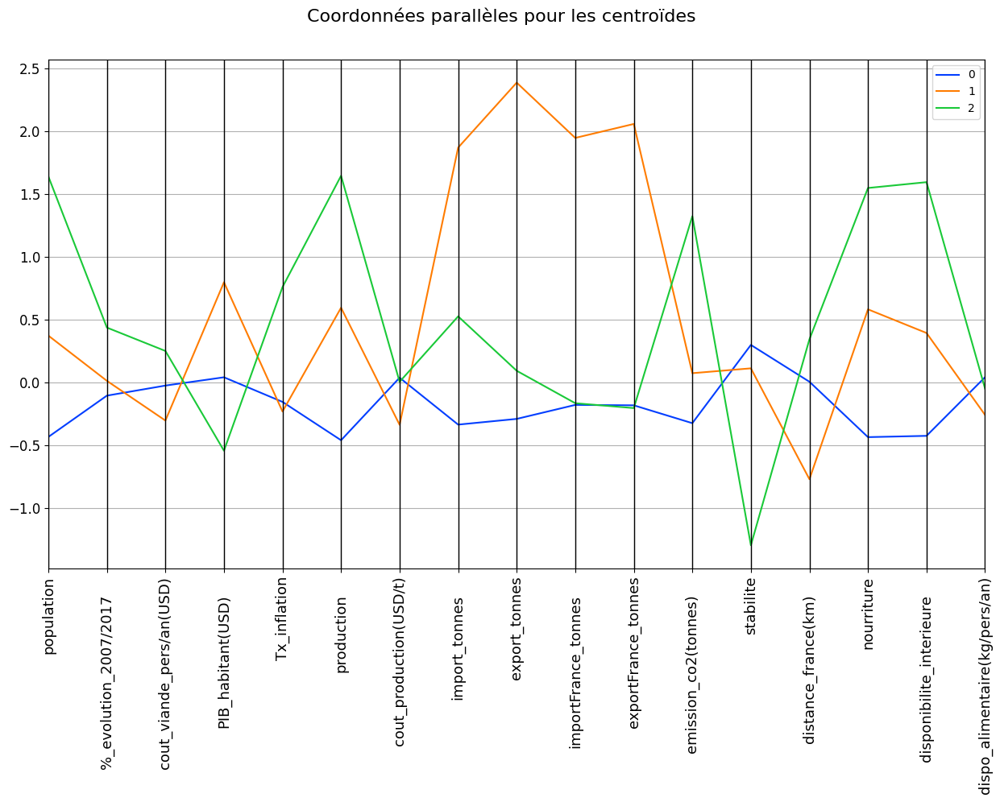

In [156]:
display_parcoord_centroids(centroids,12)

### Le cluster 1 ressort en étant, à mon sens, celui représentant au mieux les pays à cibler pour l'export :
<li> Population raisonnable</li>
<li> Coût pour une alimentation carnée de qualité relativement faible</li>
<li> PIB par habitant le plus élevé</li>
<li> Taux d'inflation sur le prix de la nourriture le plus bas</li>
<li> Importations et exportations les plus élevées (y-compris avec la France)</li>
<li> Stabilité politique élevée</li>
<li> Distance avec la France la plus faible</li>
<li> Part du poulet utilisé à l'alimentation humaine correcte</li>
<li> Disponibilité intérieure moyenne</li>
<li> Disponibilité alimentaire par habitant la plus faible</li>

## 10.6 - Extraction des pays du cluster 1

In [157]:
X_scaled_clustered.reset_index(inplace=True)
X_scaled_clustered.rename(columns={"index" : "pays"}, inplace = True)

In [158]:
df_clust1 = X_scaled_clustered[X_scaled_clustered['cluster'] == 1]

In [159]:
df_clust1["pays"].tolist()

['Allemagne',
 'Arabie saoudite',
 'Belgique',
 'Chine - RAS de Hong-Kong',
 'Espagne',
 'Pays-Bas',
 'Pologne',
 'Royaume-Uni']

# 11 - Choix des pays à cibler pour l'export de viande de poulet

### Les pays restant en course sont :
<li> L'Allemagne.</li>
<li> L'Arabie saoudite.</li>
<li> La Belgique.</li>
<li> Hong-Kong.</li>
<li> L'Espagne.</li>
<li> Les Pays-Bas.</li>
<li> La Pologne.</li>
<li> Le Royaume-Uni.</li>